***
#DM2425 Marlone Lequeux
***

This project explores the three main generative approaches—GAN, WGAN, and VAE—on both a simple 2D dataset and the MNIST dataset. It investigates how each model trains, how stable they are, and how to evaluate them using metrics like a domain-specific Fréchet Inception Distance and coverage-based criteria. I took a lot of the code back from tp2, 3 and 4 for the GANs and WGANs in 2d and for MNIST.


Plan

1. 2D Dataset  
   - Define and visualize data  
   - Train GAN, WGAN, and VAE  
   - Compare results  

2. MNIST  
   - Load and preprocess data  
   - Train VAE, ConvVAE, and WGAN  
   - Visualize reconstructions and samples  

3. Evaluation  
   - Compute domain-specific FID  
   - Analyze class coverage (CNN & NN)  
   - Compare and discuss results
   ***

##2D dataset part

In [71]:
"""
Necessary imports and device setting
"""

from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
import time
import torchvision
from torchvision.datasets import MNIST
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import math

if torch.cuda.is_available():
    device = torch.device('cuda')
    dtype = torch.cuda.FloatTensor
else:
    device = torch.device('cpu')
    dtype = torch.FloatTensor

print(device)

cuda


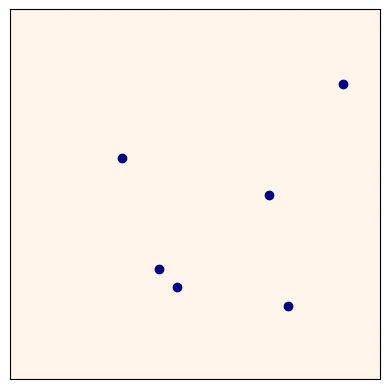

In [72]:
"""
Define define the discrete target measure that will serve as 2D dataset
"""

d = 2   # dimension of the data points
n = 6   # number of data points

y = torch.zeros((n,d), device=device)
y[0, 0] = 0.9
y[0, 1] = 0.2

y[1, 0] = 0.75
y[1, 1] = 0.8

y[2, 0] = 0.3
y[2, 1] = 0.4

y[3, 0] = 0.4
y[3, 1] = 0.7

y[4, 0] = 0.45
y[4, 1] = 0.75

y[5, 0] = 0.7
y[5, 1] = 0.5

nu = torch.ones(n, device=device)/n  # equal masses (nu is the empirical measure of the data)

# generate grid for plotting purpose
nr,nc = 256,256
extent = ((-0.5/nc, 1-0.5/nc, 1-0.5/nr, -0.5/nr))
xs = torch.linspace(0, 1, steps=nr)
ys = torch.linspace(0, 1, steps=nc)
xm, ym = torch.meshgrid(xs, ys, indexing='ij')
xm = xm.T
ym = ym.T
xgrid = torch.cat((xm.reshape(nr*nc,1),ym.reshape(nr*nc,1)),1).to(device)

# Plot data points
fig = plt.figure(dpi=100)
plt.xticks([])
plt.yticks([])
plt.imshow(np.zeros((nr,nc)),cmap = 'Oranges', extent=extent) # background
plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
plt.show()

### GAN and WGAN models

In [73]:
"""
Discriminator for WGAN
"""

class DWGAN(nn.Module):
  def __init__(self, n_in, n_hid=10):
    super(DWGAN, self).__init__()

    self.n_hid = n_hid
    self.n_in = n_in

    self.fc1 = nn.Linear(n_in, n_hid)
    self.fc2 = nn.Linear(n_hid, n_hid)
    self.fc3 = nn.Linear(n_hid, 1)

  def forward(self, x):
    y = nn.LeakyReLU(negative_slope=0.2)(self.fc1(x))
    y = nn.LeakyReLU(negative_slope=0.2)(self.fc2(y))
    y = self.fc3(y)
    return y

In [74]:
"""
Discriminator for GAN
"""

class DGAN(DWGAN):
  def __init__(self, n_in, n_hid=10):
    super(DGAN, self).__init__(n_in, n_hid)

  def forward(self, x):
    y = super().forward(x)
    y = nn.Sigmoid()(y)
    return y

In [75]:
"""
Generator for GAN and WGAN
"""

class Generator(torch.nn.Module):
    def __init__(self, n_in, n_out, n_hid=10, nlayers=3, device=torch.device("cpu")):
        super(Generator, self).__init__()

        self.n_in = n_in
        self.n_out = n_out
        self.n_hid = n_hid
        self.nlayers = nlayers
        self.hidden = nn.ModuleList()

        for n in range(nlayers):
            n_in_t = n_in if n==0 else n_hid
            self.hidden.append(nn.Sequential(
            nn.Linear(n_in_t, n_hid),
            nn.ELU(1)
        ).to(device))

        self.out = nn.Sequential(
            nn.Linear(n_hid, n_out),
            nn.Sigmoid()
        ).to(device)

        self.apply(self._init_weights)


    def forward(self, x):
        for n in range(self.nlayers):
            x = self.hidden[n](x)
        x = self.out(x)
        return x


    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.xavier_uniform_(module.weight, 1.0)
            if module.bias is not None:
                module.bias.data.zero_()

In [76]:
"""
Losses for GAN and WGAN (discriminator and generator)
"""

def gradient_penalty(D, x, y):
    # Calculate interpolation
    b = x.shape[0]
    n = y.shape[0]
    alpha = torch.rand((b, n, 1),device=device)
    interp = (alpha * y[None,:,:] + (1 - alpha) * x[:,None,:]).flatten(end_dim=1)
    interp.requires_grad_()

    Di = D(interp).view(-1)

    # Calculate gradients of probabilities with respect to examples
    gradients = torch.autograd.grad(
        outputs=Di,
        inputs=interp,
        grad_outputs=torch.ones(Di.size()).to(device),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]

    # Derivatives of the gradient close to 0 can cause problems because of
    # the square root, so manually calculate norm and add epsilon
    gradients_norm = torch.sqrt(torch.sum(gradients**2, dim=1)) + 1e-12

    # Return gradient penalty
    return ((gradients_norm - 1) ** 2).mean()

def discriminator_loss(fake, real):
    # loss for gan discriminator
    return -torch.log(1-fake).mean() - torch.log(real).mean()

def wdiscriminator_loss(fake, real):
    # loss for wgan discriminator
    return -real.mean() + fake.mean()

def generator_loss(fake):
    # loss for gan generator
    return -torch.log(fake).mean()

def wgenerator_loss(fake):
    # loss for wgan generator
    return -fake.mean()

In [77]:
"""
General function to train WGAN or GAN
"""

def train_gan(n_epochs=100,
              niterD =100, niterG=10,
              lrD=0.002, lrG=0.002,
              beta1=0.5, beta2=0.999,
              gpw=0.1,
              is_gan=True,
              iter_display=10,
              b = 100,
              ):
    n_in = 10

    # Define generator and discriminator
    if is_gan:
        D = DGAN(n_in=d, n_hid=10).to(device)
    else:
        D = DWGAN(n_in=d, n_hid=10).to(device)
    G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3).to(device)

    # define optimizer for both
    optimG = optim.Adam(G.parameters(), lr=lrG)
    optimD = optim.Adam(D.parameters(), lr=lrD, betas=(beta1, beta2))

    Glosses = []
    Dlosses = []
    for epoch in tqdm(range(n_epochs)):
        # Train discriminator (niterD iterations)
        for iter in range(0, niterD):
            z = torch.randn(b, n_in, device=device)
            x_fake = G(z).detach()
            optimD.zero_grad()
            if is_gan:
                Dloss = discriminator_loss(D(x_fake), D(y))
            else:
                Dloss = wdiscriminator_loss(D(x_fake), D(y)) + gpw * gradient_penalty(D, x_fake, y)
            Dloss.backward()
            optimD.step()

        # Train generator (niterG iterations)
        for iter in range(niterG):

            z = torch.randn(b, n_in, device=device)
            x_fake = G(z)
            optimG.zero_grad()
            if is_gan:
                Gloss = generator_loss(D(x_fake))
            else:
                Gloss = wgenerator_loss(D(x_fake))
            Gloss.backward()
            optimG.step()

        Glosses.append(Gloss.item())
        Dlosses.append(Dloss.item())

        if epoch % iter_display == 0:
            # print data
            Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
            z = torch.randn(b, n_in, device=device)
            x = G(z)
            xd = x.detach().squeeze(1)
            fig = plt.figure(dpi=100)
            plt.xticks([])
            plt.yticks([])
            plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)
            plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
            plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
            plt.show()

            # print losses
            plt.figure(dpi=100)
            plt.plot(Dlosses,label='D')
            plt.plot(Glosses,label='G')
            plt.title('Loss evolution')
            plt.legend()
            plt.show()

    return D, G

  0%|          | 0/300 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/autograd/graph.py:825: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at ../aten/src/ATen/cuda/CublasHandlePool.cpp:135.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


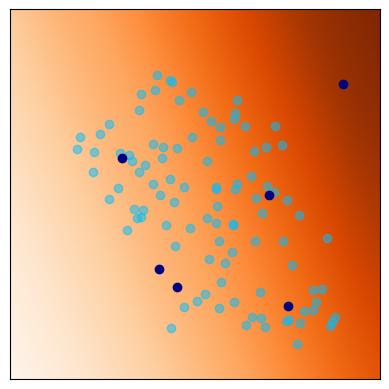

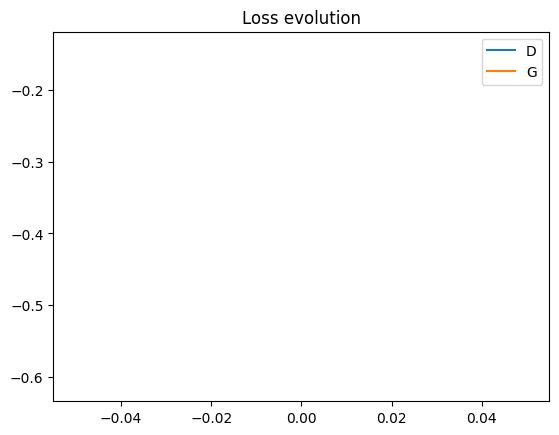

  7%|▋         | 20/300 [00:10<02:48,  1.67it/s]

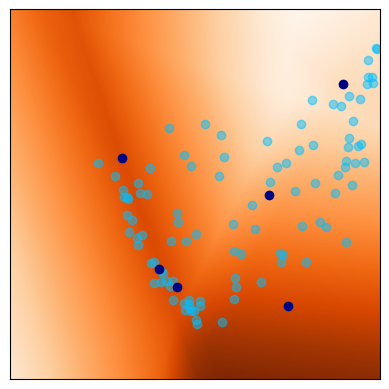

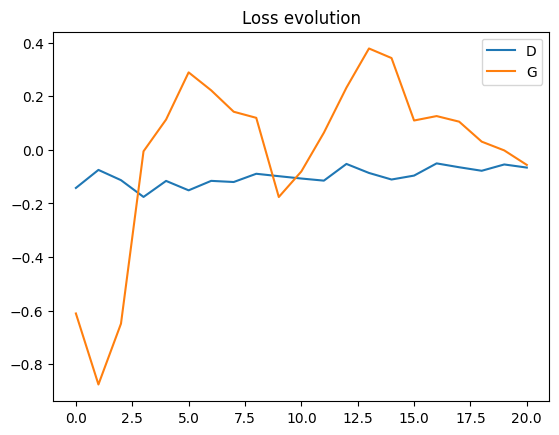

 13%|█▎        | 40/300 [00:23<02:39,  1.63it/s]

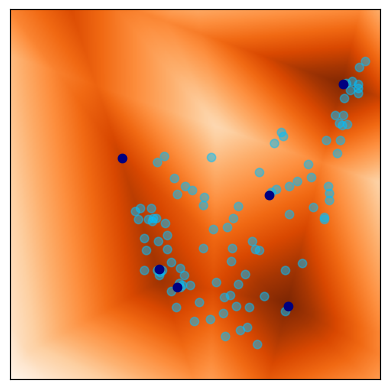

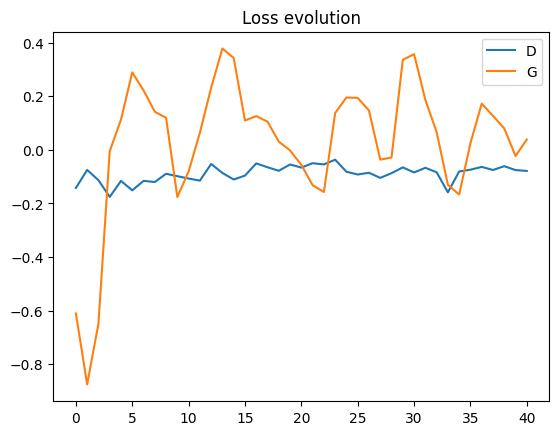

 20%|██        | 60/300 [00:34<01:45,  2.27it/s]

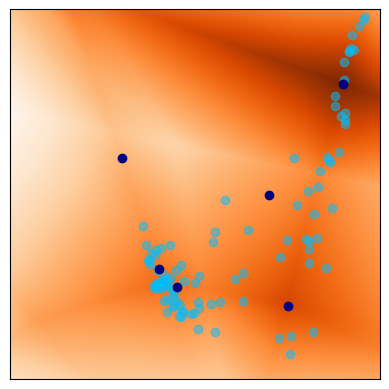

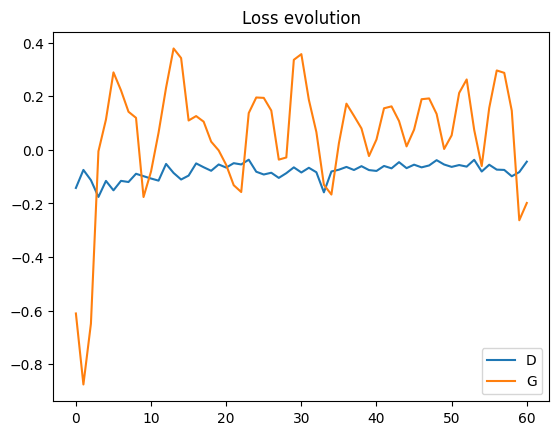

 27%|██▋       | 80/300 [00:43<01:31,  2.41it/s]

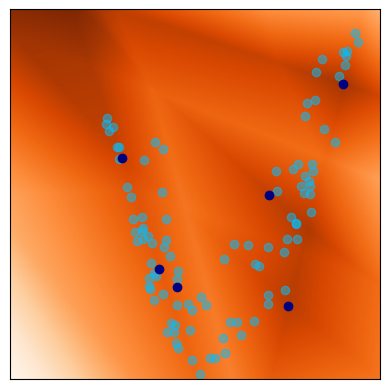

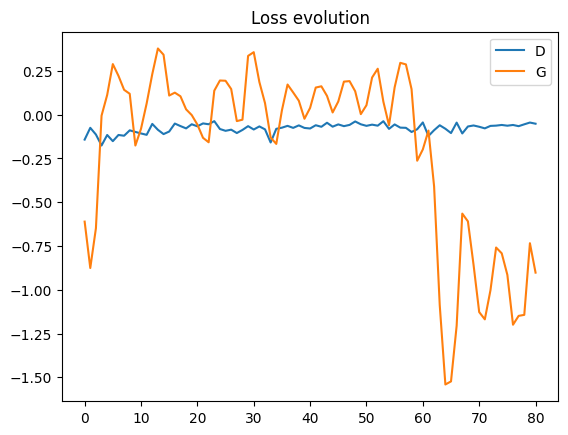

 33%|███▎      | 100/300 [00:52<01:25,  2.35it/s]

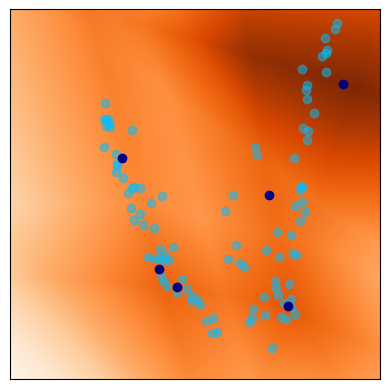

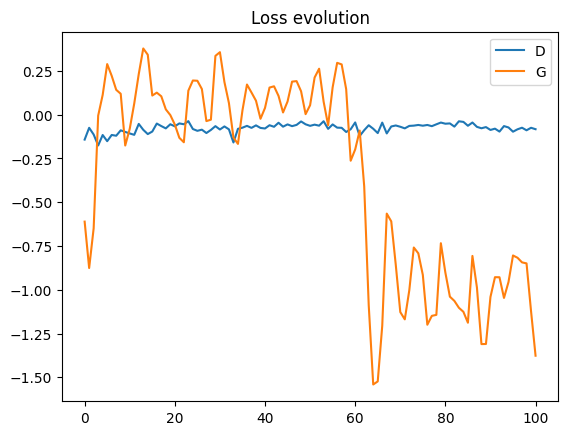

 40%|████      | 120/300 [01:01<01:30,  1.99it/s]

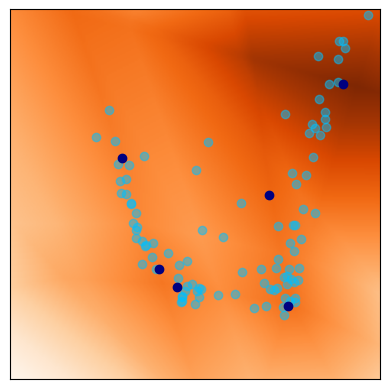

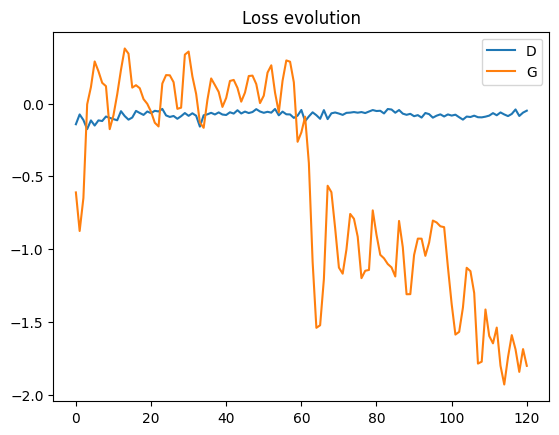

 47%|████▋     | 140/300 [01:10<01:06,  2.39it/s]

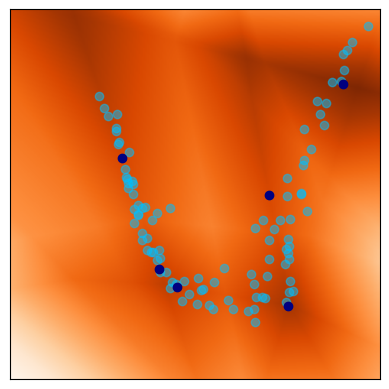

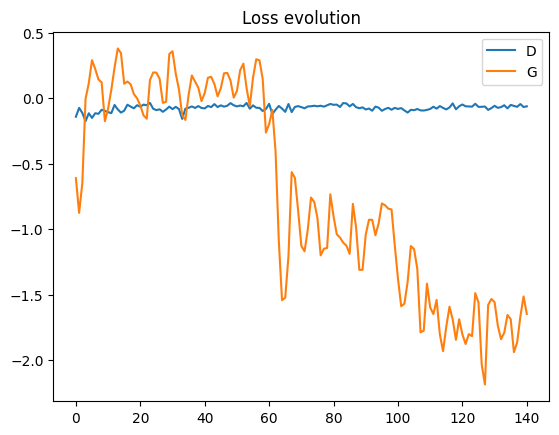

 53%|█████▎    | 160/300 [01:19<00:58,  2.39it/s]

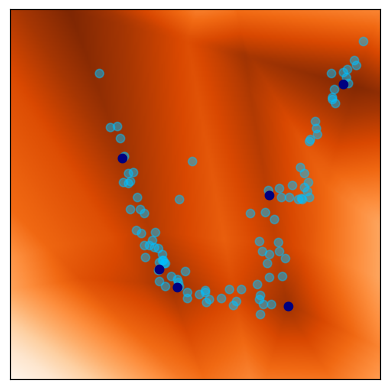

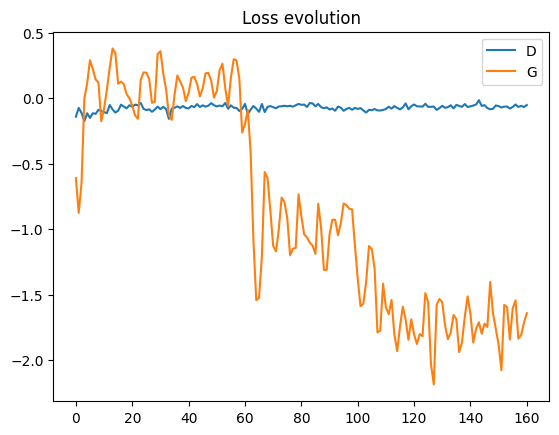

 60%|██████    | 180/300 [01:29<00:55,  2.17it/s]

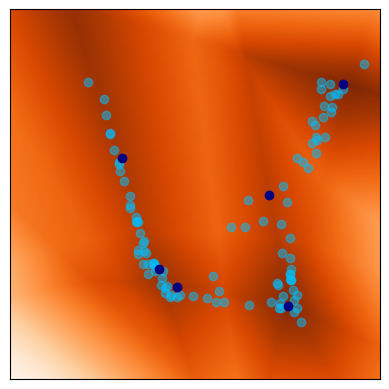

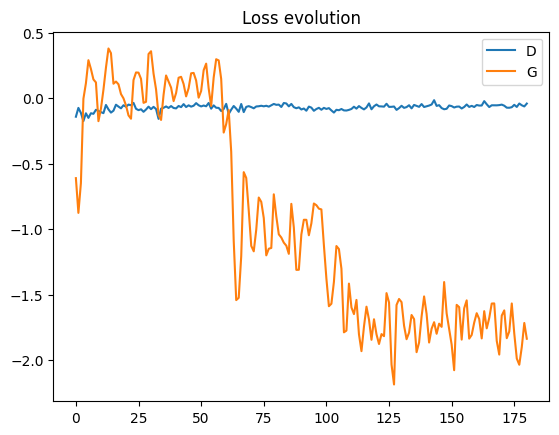

 67%|██████▋   | 200/300 [01:38<00:49,  2.01it/s]

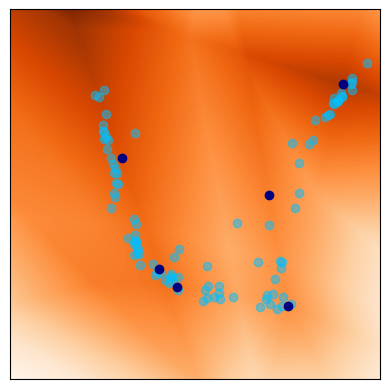

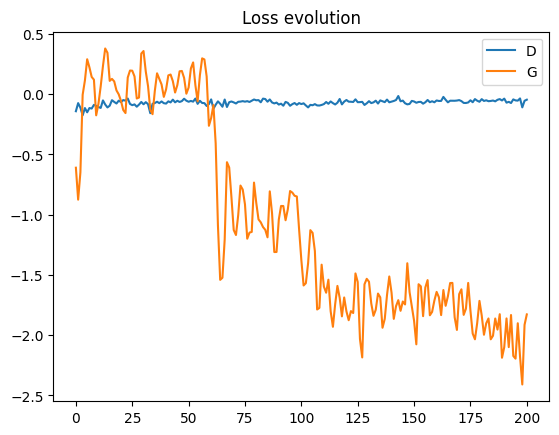

 73%|███████▎  | 220/300 [01:46<00:33,  2.41it/s]

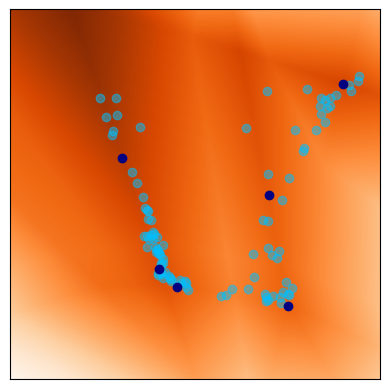

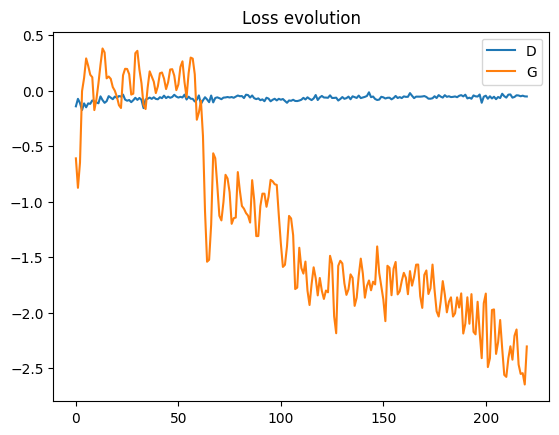

 80%|████████  | 240/300 [01:55<00:25,  2.36it/s]

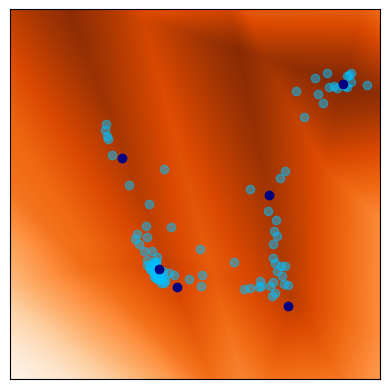

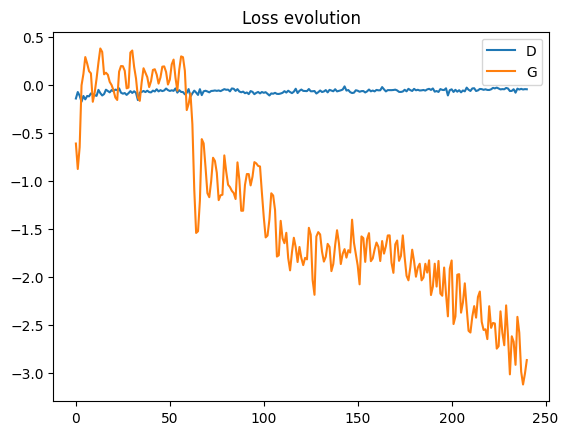

 87%|████████▋ | 260/300 [02:05<00:17,  2.34it/s]

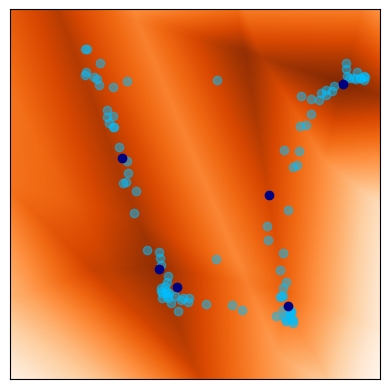

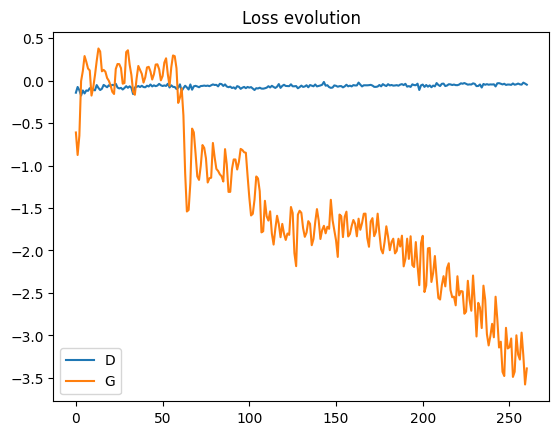

 93%|█████████▎| 280/300 [02:14<00:10,  2.00it/s]

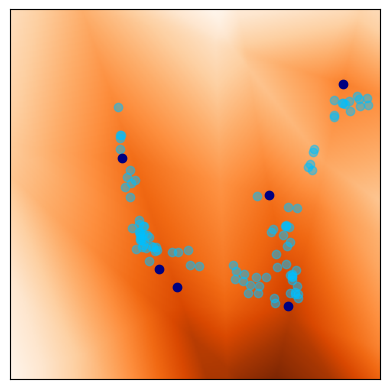

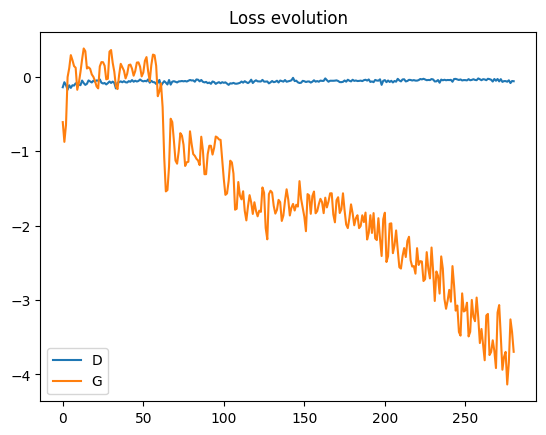

100%|██████████| 300/300 [02:22<00:00,  2.10it/s]


In [ ]:
disc2d_wgan, gen2d_wgan = train_gan(is_gan=False, n_epochs=300, iter_display=20)

  0%|          | 0/300 [00:00<?, ?it/s]

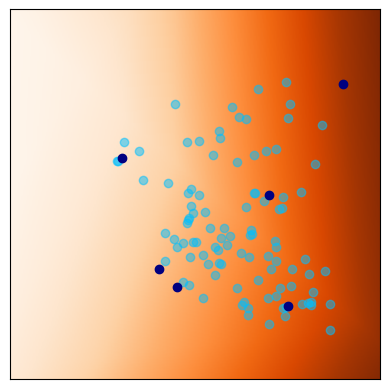

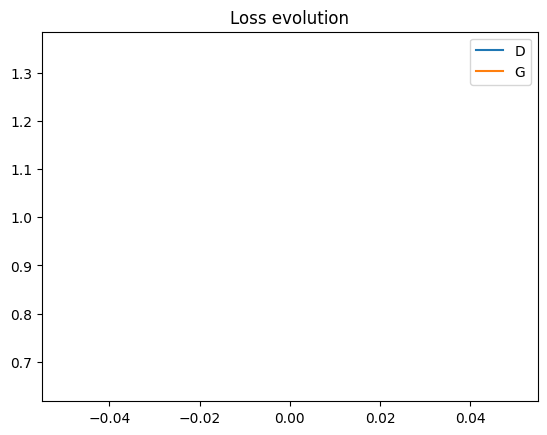

  7%|▋         | 20/300 [00:06<01:29,  3.12it/s]

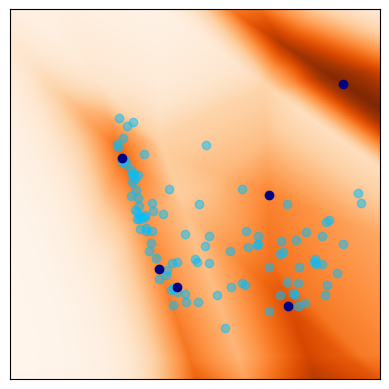

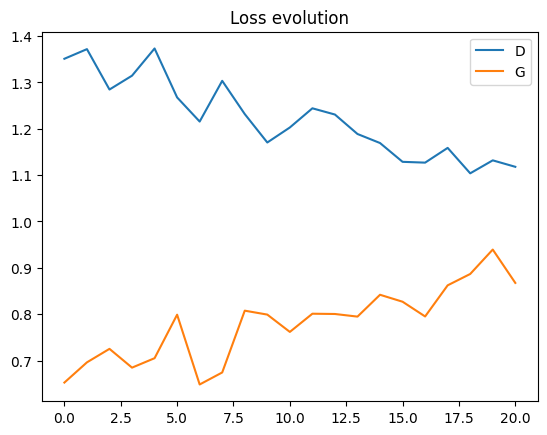

 13%|█▎        | 40/300 [00:12<01:15,  3.42it/s]

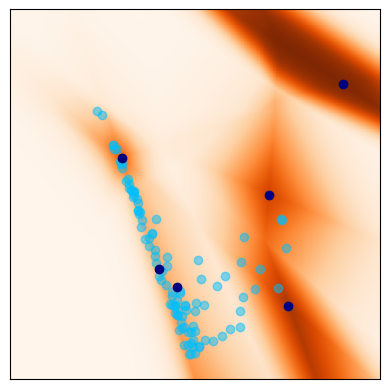

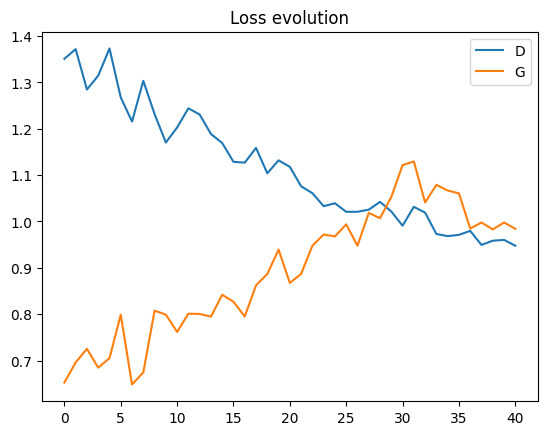

 20%|██        | 60/300 [00:19<01:11,  3.36it/s]

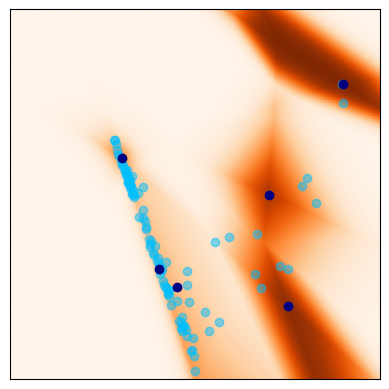

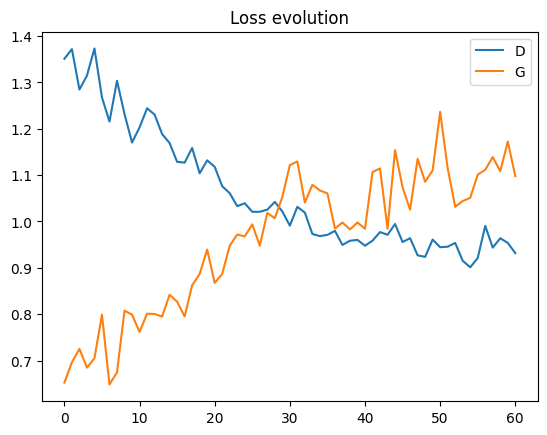

 27%|██▋       | 80/300 [00:25<01:03,  3.45it/s]

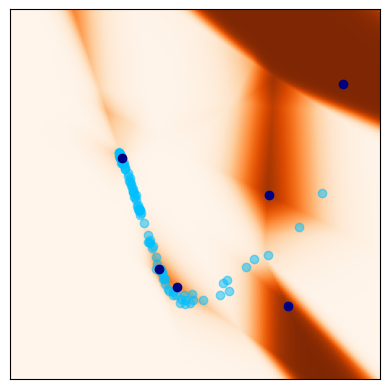

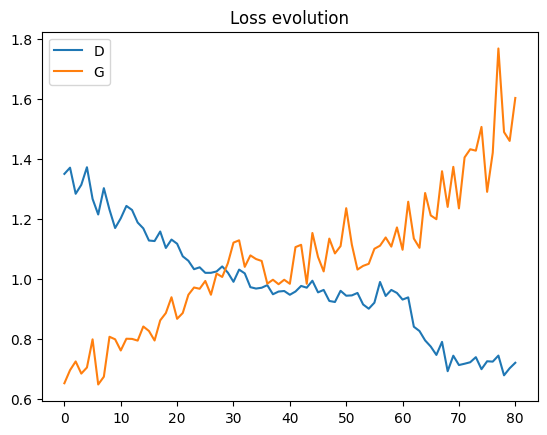

 33%|███▎      | 100/300 [00:31<00:58,  3.41it/s]

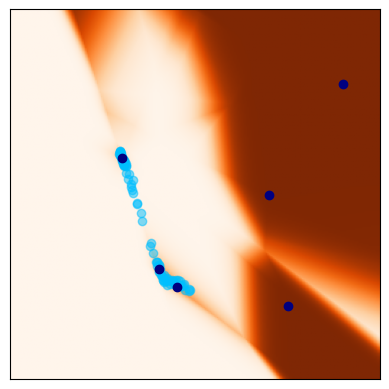

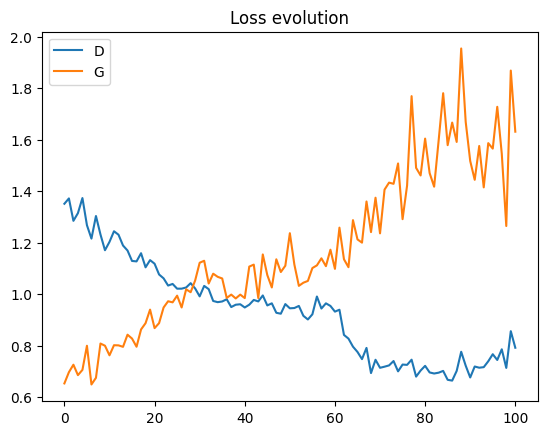

 40%|████      | 120/300 [00:38<00:53,  3.39it/s]

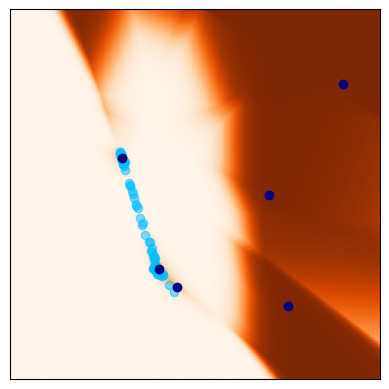

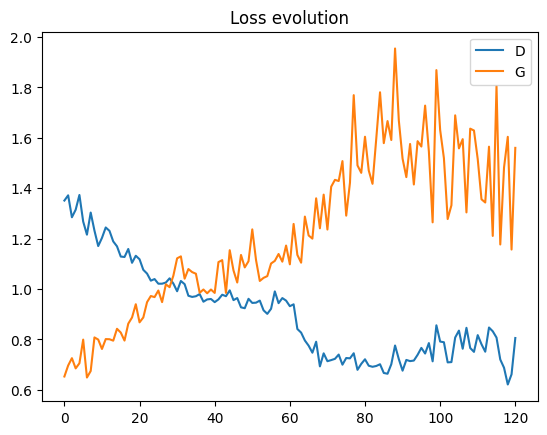

 47%|████▋     | 140/300 [00:44<00:46,  3.45it/s]

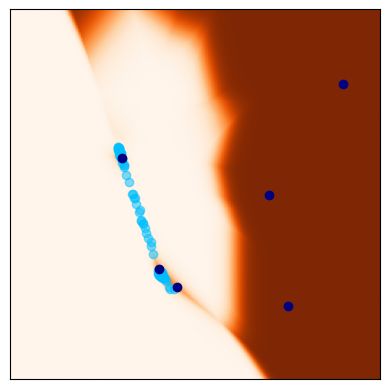

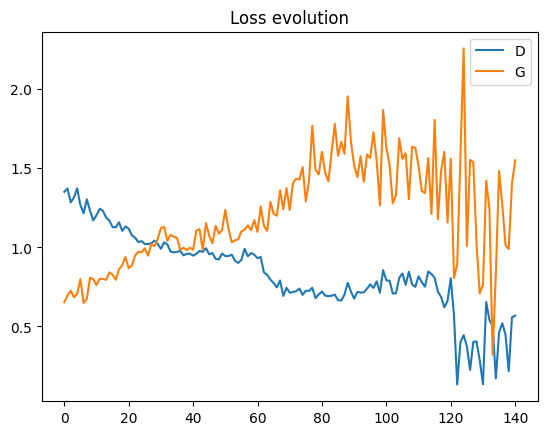

 53%|█████▎    | 160/300 [00:50<00:41,  3.40it/s]

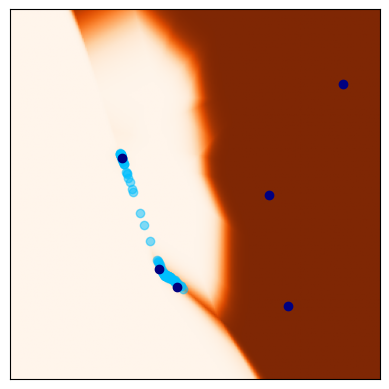

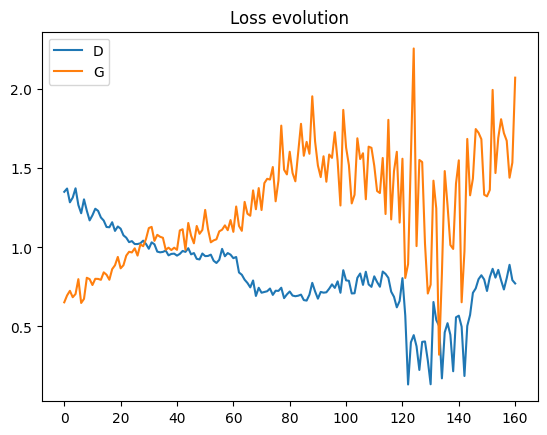

 60%|██████    | 180/300 [00:57<00:35,  3.43it/s]

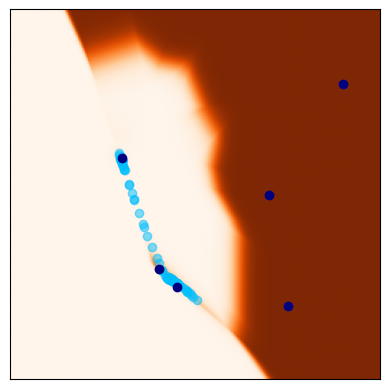

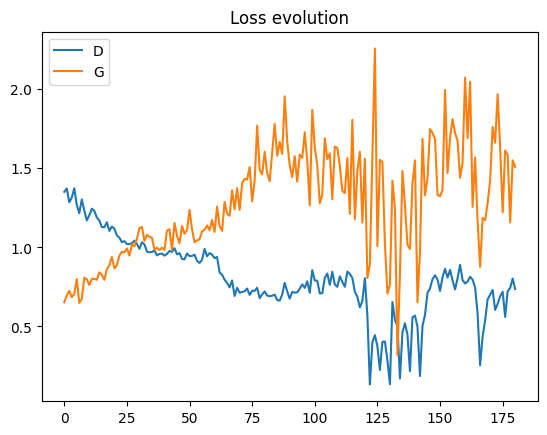

 67%|██████▋   | 200/300 [01:03<00:33,  2.97it/s]

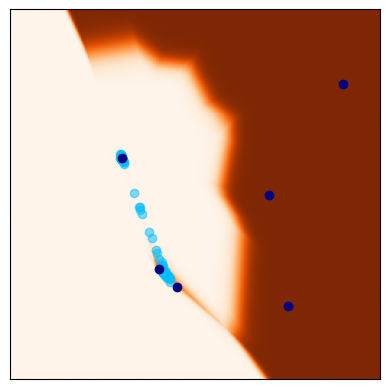

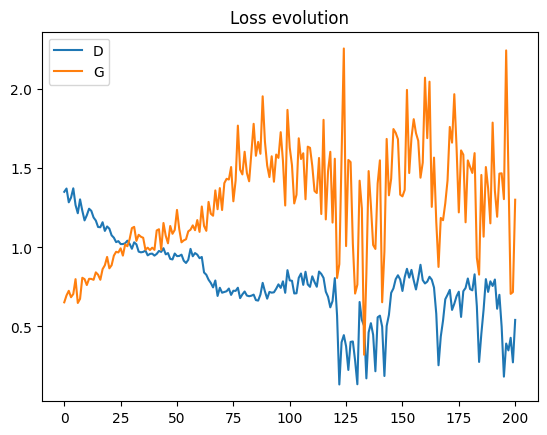

 73%|███████▎  | 220/300 [01:10<00:23,  3.42it/s]

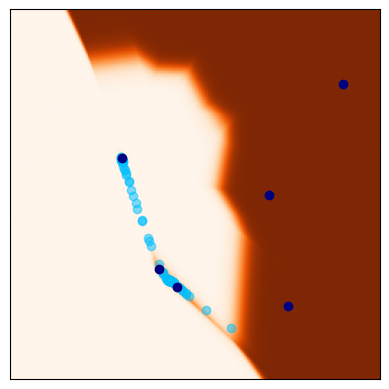

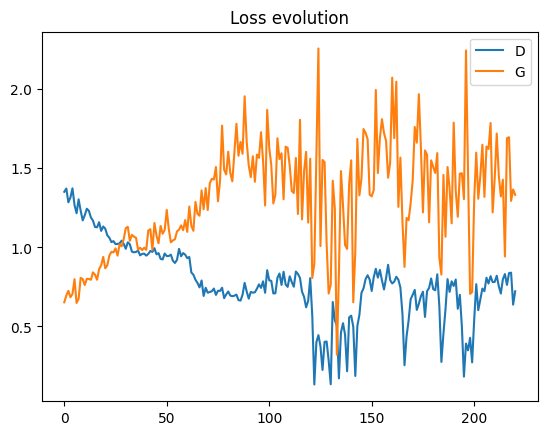

 80%|████████  | 240/300 [01:17<00:20,  2.94it/s]

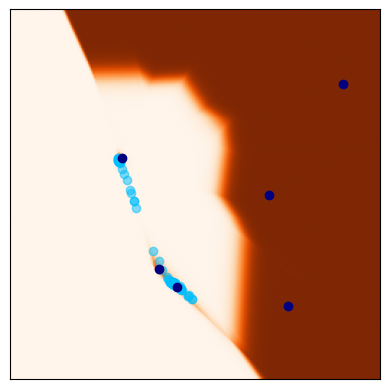

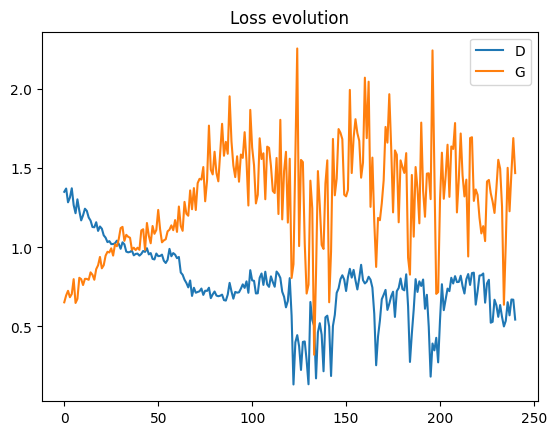

 87%|████████▋ | 260/300 [01:23<00:11,  3.45it/s]

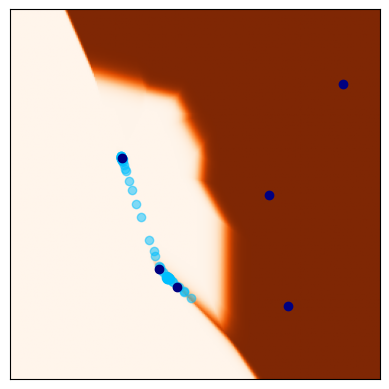

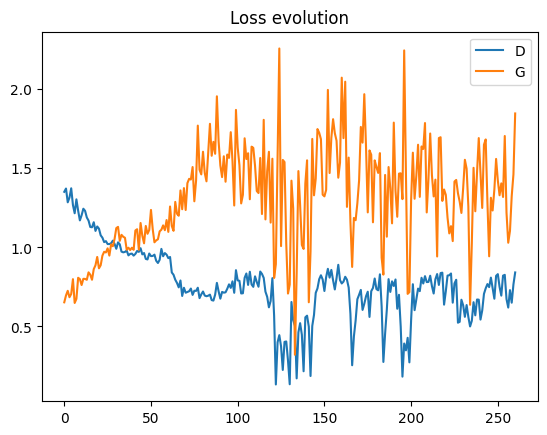

 93%|█████████▎| 280/300 [01:29<00:06,  3.20it/s]

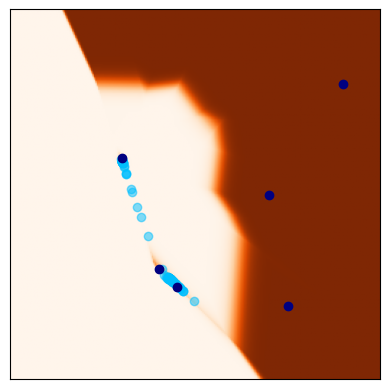

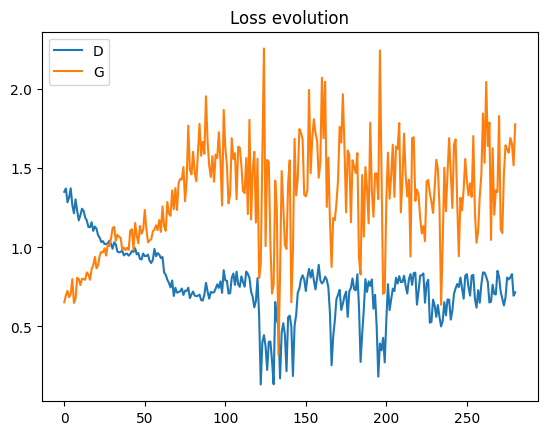

100%|██████████| 300/300 [01:36<00:00,  3.12it/s]


In [78]:
disc2d_gan, gen2d_gan = train_gan(n_epochs=300, is_gan=True, b=100, iter_display=20)

##Visualisation of generated data for WGAN and GAN in 2d

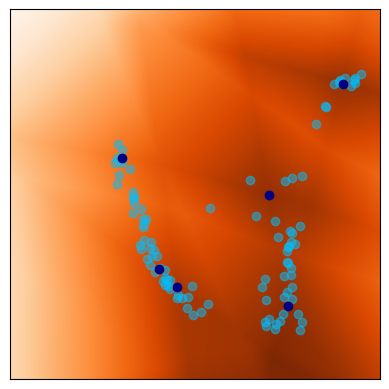

In [ ]:
Dxgrid = disc2d_wgan(xgrid).detach().cpu().numpy().reshape(nr,nc)
z = torch.randn(100, 10, device=device)
x = gen2d_wgan(z)
xd = x.detach().squeeze(1)
fig = plt.figure(dpi=100)
plt.xticks([])
plt.yticks([])
plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)
plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
plt.show()

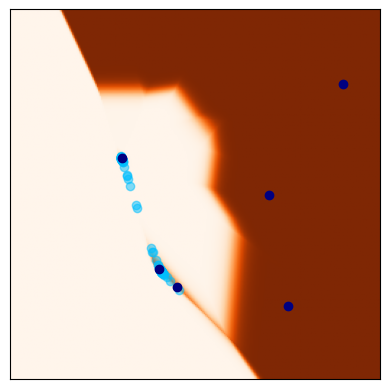

In [79]:
Dxgrid = disc2d_gan(xgrid).detach().cpu().numpy().reshape(nr,nc)
z = torch.randn(100, 10, device=device)
x = gen2d_gan(z)
xd = x.detach().squeeze(1)
fig = plt.figure(dpi=100)
plt.xticks([])
plt.yticks([])
plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)
plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
plt.show()

###VAE

In [ ]:
"""
Simplest VAE implementation
"""

class Encoder(nn.Module):
    def __init__(self, input_dim=784, hidden_dim=400, z_dim=20):
        super(Encoder, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_mu = nn.Linear(hidden_dim, z_dim)
        self.fc_logvar = nn.Linear(hidden_dim, z_dim)

    def forward(self, x):
        """
        Forward pass of the encoder.
        """
        h = torch.relu(self.fc1(x))
        h = torch.relu(self.fc2(h))
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar


class Decoder(nn.Module):
    def __init__(self, z_dim=20, hidden_dim=400, output_dim=784):
        super(Decoder, self).__init__()
        self.fc1 = nn.Linear(z_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_out = nn.Linear(hidden_dim, output_dim)

    def forward(self, z):
        """
        Forward pass of the decoder.
        """
        h = torch.relu(self.fc1(z))
        h = torch.relu(self.fc2(h))
        x_recon = self.fc_out(h)
        return x_recon


class VAE(nn.Module):
    def __init__(self, input_dim=784, hidden_dim=400, z_dim=20):
        super(VAE, self).__init__()
        self.encoder = Encoder(input_dim, hidden_dim, z_dim)
        self.decoder = Decoder(z_dim, hidden_dim, input_dim)

    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick: z = mu + sigma * eps,
        where eps ~ N(0, I).
        """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        """
        Full forward pass of the VAE:
          1. Encode x into mu, logvar
          2. Reparameterize to get a latent sample z
          3. Decode z back into reconstructed x
        Returns x_recon, mu, logvar
        """
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar

In [ ]:
"""
Loss function for VAE
"""

def loss_function(x_recon, x, mu, logvar):
    """
    Computes the VAE loss = reconstruction loss + KL divergence.
    """
    # Reconstruction loss
    recon_loss = nn.functional.mse_loss(x_recon, x, reduction='sum')

    # KL divergence term
    kld = -0.5 * torch.sum(1 + logvar - mu**2 - logvar.exp())

    return (recon_loss + kld) / x.size(0)

In [ ]:
def train_vae(
    model,
    y,
    lr=1e-3,
    num_epochs=100,
    print_every=100,
    flatten=False
):
    optimizer = optim.Adam(model.parameters(), lr=lr, betas=(0.5, 0.999))
    model.train()

    for epoch in range(1, num_epochs + 1):
        x = y.to(device)

        optimizer.zero_grad()
        x_recon, mu, logvar = model(x)
        loss = loss_function(x_recon, x, mu, logvar)
        loss.backward()
        optimizer.step()

        if epoch % print_every == 0 or epoch == 1:
            print(f"Epoch [{epoch}/{num_epochs}] Loss: {loss.item():.6f}")

    return model


In [ ]:
z_dim = 10
vae2d = VAE(input_dim=2, hidden_dim=32, z_dim=z_dim).to(device)

In [ ]:
# Train
vae2d = train_vae(model=vae2d, y=y, lr=1e-4, num_epochs=20, print_every=1)

Epoch [1/20] Loss: 0.937065
Epoch [2/20] Loss: 0.990181
Epoch [3/20] Loss: 0.917650
Epoch [4/20] Loss: 0.976544
Epoch [5/20] Loss: 1.106199
Epoch [6/20] Loss: 0.879986
Epoch [7/20] Loss: 0.979155
Epoch [8/20] Loss: 1.029333
Epoch [9/20] Loss: 0.887786
Epoch [10/20] Loss: 0.928781
Epoch [11/20] Loss: 0.984987
Epoch [12/20] Loss: 0.856916
Epoch [13/20] Loss: 0.942844
Epoch [14/20] Loss: 0.937243
Epoch [15/20] Loss: 0.936217
Epoch [16/20] Loss: 1.042819
Epoch [17/20] Loss: 0.917178
Epoch [18/20] Loss: 0.846766
Epoch [19/20] Loss: 0.916268
Epoch [20/20] Loss: 0.978900


In [ ]:
z = torch.randn(100, z_dim, device=device)
with torch.no_grad():
    samples = vae2d.decoder(z).detach().cpu()

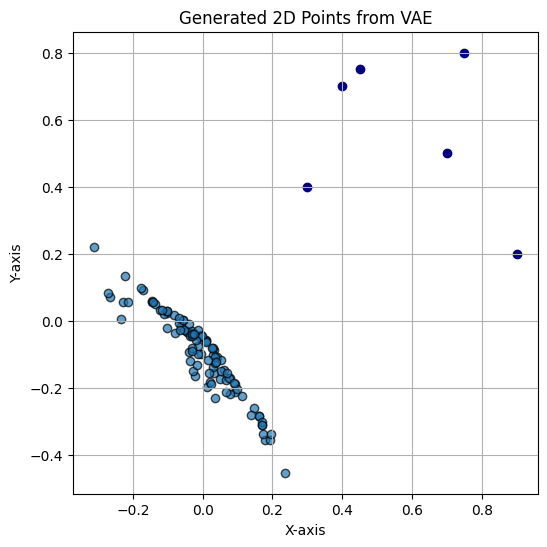

In [ ]:
plt.figure(figsize=(6, 6))
plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
plt.scatter(samples[:, 0], samples[:, 1], alpha=0.7, edgecolors='k')
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.title("Generated 2D Points from VAE")
plt.grid(True)
plt.show()

***
##Question 1.a.
I believe the question is asking us about the difference between GAN and WGAN algorithms. A standard GAN relies on a discriminator that classifies its generator's output using a log-based loss, whereas WGAN uses a discriminator that computes a real-valued score and is constrained to be 1-Lipschitz, (via weight clipping or gradient penalties). This leads WGAN to approximate the Wasserstein distance, providing smoother gradients and typically more stable training compared to the objective in standard GANs. As a result, we can see that WGANs exhibit fewer issues with mode collapse and vanishing gradients, which can be especially visible in our 2D problems.

***

##Question 1.b.
The standard GAN algorithm suffers from stability issues during training, primarily due to the nature of its objective. One major problem is mode collapse that we can see, where the generator learns to produce only a limited set of outputs, failing to capture the full diversity of the real data distribution. Another issue is vanishing gradients. This is because of the sigmoid activation in the discriminator, leading to saturation of the loss function. Additionally, we can see oscillations behavior on the loss, where the generator and discriminator continuously outmaneuver each other rather than converging to a stable equilibrium (we also see that a little bit on the wgan).

***

##Question 2.a.
Difficulties in Parameter Adjustment
A major challenge is that each algorithm—GAN, WGAN, and VAE—responds very differently to hyperparameters like learning rates, batch sizes, and network architectures. For instance, WGAN requires careful tuning of the gradient penalty term to avoid gradient explosion or collapse, while classical GAN is highly sensitive to the discriminator–generator balance (e.g., if the discriminator is too strong, mode collapse can happen quickly). Even VAEs, though generally more stable, can require careful selection of the reconstruction vs. KL-divergence weighting to avoid blurry outputs or degenerate latent spaces. In practice, you often have to rely on trial-and-error with heuristics such as early stopping or checking validation metrics (like visual fidelity or coverage) to find a stable setup for each model.

***

##Question 2.b.
Visually comparing the learned models can reveal key differences.

GAN might produce samples that look realistic in some regions but occasionally misses parts of the data distribution (mode dropping).
WGAN often covers the data more evenly, because the Wasserstein distance encourages better alignment of the real and generated distributions. However, if hyperparameters are off (especially the gradient penalty), it can still produce spurious or collapsed regions.
VAE tends to produce smoother interpolations thanks to its continuous latent space, but sometimes at the cost of less sharply defined samples or overly “average” outputs.
Qualitatively, you’d look for how well each set of samples fills the space of the training data (coverage) and whether the learned latent space allows smooth transitions between points (interpolation).

***

##Question 3:

In [ ]:
"""
MNIST dataset
"""

# Define a transform that converts images to [0,1] then binarizes them
binarize_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: (x > 0.5).float())
])

# Download and load the binarized MNIST dataset
train_dataset = datasets.MNIST(
    root='./data',
    train=True,
    download=True,
    transform=binarize_transform
)
test_dataset = datasets.MNIST(
    root='./data',
    train=False,
    download=True,
    transform=binarize_transform
)

batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 9.91M/9.91M [00:00<00:00, 16.0MB/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 28.9k/28.9k [00:00<00:00, 480kB/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 1.65M/1.65M [00:00<00:00, 4.43MB/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 4.54k/4.54k [00:00<00:00, 7.52MB/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



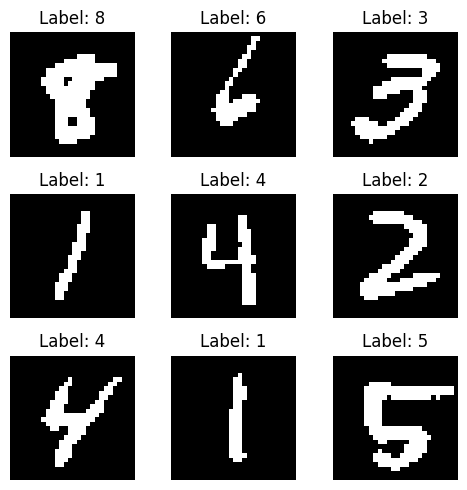

In [ ]:
"""
Visualise some data
"""

# Get one batch of data
images, labels = next(iter(train_loader))

# images has shape [batch_size, 1, 28, 28]
# Visualize 9 images in a 3x3 grid
plt.figure(figsize=(5,5))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(images[i].squeeze(0), cmap='gray', vmin=0, vmax=1)
    plt.title(f"Label: {labels[i].item()}")
    plt.axis('off')
plt.tight_layout()
plt.show()

###Simple VAE for MNIST

In [ ]:
"""
Simple VAE for MNIST with batchnorm, more layers and dropout
"""

class Encoder(nn.Module):
    def __init__(self, input_dim=784, hidden_dim=400, z_dim=20):
        super(Encoder, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.bn2 = nn.BatchNorm1d(hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, hidden_dim)
        self.bn3 = nn.BatchNorm1d(hidden_dim)
        self.fc_mu = nn.Linear(hidden_dim, z_dim)
        self.fc_logvar = nn.Linear(hidden_dim, z_dim)
        self.dropout = nn.Dropout(p=0.2)

    def forward(self, x):
        h = F.leaky_relu(self.bn1(self.fc1(x)), negative_slope=0.1)
        h = self.dropout(h)
        h = F.leaky_relu(self.bn2(self.fc2(h)), negative_slope=0.1)
        h = self.dropout(h)
        h = F.leaky_relu(self.bn3(self.fc3(h)), negative_slope=0.1)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar


class Decoder(nn.Module):
    def __init__(self, z_dim=20, hidden_dim=400, output_dim=784):
        super(Decoder, self).__init__()
        self.fc1 = nn.Linear(z_dim, hidden_dim)
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.bn2 = nn.BatchNorm1d(hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, hidden_dim)
        self.bn3 = nn.BatchNorm1d(hidden_dim)
        self.fc_out = nn.Linear(hidden_dim, output_dim)
        self.dropout = nn.Dropout(p=0.2)

    def forward(self, z):
        h = F.leaky_relu(self.bn1(self.fc1(z)), negative_slope=0.1)
        h = self.dropout(h)
        h = F.leaky_relu(self.bn2(self.fc2(h)), negative_slope=0.1)
        h = self.dropout(h)
        h = F.leaky_relu(self.bn3(self.fc3(h)), negative_slope=0.1)
        x_logit = self.fc_out(h)
        x_recon = torch.sigmoid(x_logit)
        return x_recon


class VAE(nn.Module):
    def __init__(self, input_dim=784, hidden_dim=400, z_dim=20):
        super(VAE, self).__init__()
        self.encoder = Encoder(input_dim, hidden_dim, z_dim)
        self.decoder = Decoder(z_dim, hidden_dim, input_dim)
        self.initialize_weights()

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar

    def initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)


In [ ]:
"""
I wanted to try VAE with Convolutionnal layers, even though for a simple dataset
such as mnist, I think the improvement will be small
"""

class ConvEncoder(nn.Module):
    def __init__(self, z_dim=20):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 32, 4, 2, 1)  # 28x28 -> 14x14
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, 4, 2, 1) # 14x14 -> 7x7
        self.bn2 = nn.BatchNorm2d(64)
        self.fc_mu = nn.Linear(64*7*7, z_dim)
        self.fc_logvar = nn.Linear(64*7*7, z_dim)
        self.dropout = nn.Dropout(p=0.2)

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.conv1(x)), 0.1)
        x = self.dropout(x)
        x = F.leaky_relu(self.bn2(self.conv2(x)), 0.1)
        x = self.dropout(x)
        x = x.view(x.size(0), -1)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

class ConvDecoder(nn.Module):
    def __init__(self, z_dim=20):
        super().__init__()
        self.fc = nn.Linear(z_dim, 64*7*7)
        self.convT1 = nn.ConvTranspose2d(64, 32, 4, 2, 1)  # 7x7 -> 14x14
        self.bn1 = nn.BatchNorm2d(32)
        self.convT2 = nn.ConvTranspose2d(32, 1, 4, 2, 1)   # 14x14 -> 28x28
        self.dropout = nn.Dropout(p=0.2)

    def forward(self, z):
        x = self.fc(z)
        x = x.view(x.size(0), 64, 7, 7)
        x = F.leaky_relu(self.bn1(self.convT1(x)), 0.1)
        x = self.dropout(x)
        x = torch.sigmoid(self.convT2(x))
        return x

class ConvVAE(nn.Module):
    def __init__(self, z_dim=20):
        super().__init__()
        self.encoder = ConvEncoder(z_dim)
        self.decoder = ConvDecoder(z_dim)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar



In [ ]:
"""
For the reconstruction loss we're going to use binary cross-entropy instead of MSE
"""

def loss_function(x_recon, x, mu, logvar):
    """
    Computes the VAE loss = reconstruction loss + KL divergence.
    """
    # Reconstruction loss (binary cross-entropy)
    # sum over the 784 pixels, then average over batch
    bce = nn.functional.binary_cross_entropy(x_recon, x, reduction='sum')

    # KL divergence term
    # KL( N(mu, sigma^2) || N(0, 1)) = 0.5 * sum( exp(logvar) + mu^2 - 1 - logvar )
    kld = -0.5 * torch.sum(1 + logvar - mu**2 - logvar.exp())

    return (bce + kld) / x.size(0)  # Divide by batch size for an average

In [ ]:
"""
Train function for VAE for MNIST
"""

def train_vae(
    model,
    dataloader,
    lr=1e-3,
    num_epochs=100,
    print_every=100,
    flatten=False
):
    optimizer = optim.Adam(model.parameters(), lr=lr)
    model.train()

    for epoch in range(1, num_epochs + 1):
        for batch_idx, (data, _) in enumerate(tqdm(dataloader)):
            x = data.to(device)
            if flatten:
                x = x.view(data.shape[0], -1)

            optimizer.zero_grad()
            x_recon, mu, logvar = model(x)
            loss = loss_function(x_recon, x, mu, logvar)
            loss.backward()
            optimizer.step()

        if epoch % print_every == 0 or epoch == 1:
            print(f"Epoch [{epoch}/{num_epochs}] Loss: {loss.item():.6f}")


In [ ]:
z_dim = 20
hidden_dim = 400
lr = 1e-3
num_epochs = 10

vae_mnist = VAE(input_dim=784, hidden_dim=hidden_dim, z_dim=z_dim).to(device)

train_vae(vae_mnist, train_loader, num_epochs=num_epochs, print_every=1, flatten=True)

100%|██████████| 469/469 [00:09<00:00, 49.09it/s]


Epoch [1/10] Loss: 121.850647


100%|██████████| 469/469 [00:09<00:00, 49.39it/s]


Epoch [2/10] Loss: 118.294762


100%|██████████| 469/469 [00:09<00:00, 49.79it/s]


Epoch [3/10] Loss: 112.454849


100%|██████████| 469/469 [00:08<00:00, 53.41it/s]


Epoch [4/10] Loss: 111.313828


100%|██████████| 469/469 [00:09<00:00, 50.32it/s]


Epoch [5/10] Loss: 110.177292


100%|██████████| 469/469 [00:09<00:00, 50.30it/s]


Epoch [6/10] Loss: 110.080986


100%|██████████| 469/469 [00:09<00:00, 50.05it/s]


Epoch [7/10] Loss: 100.860313


100%|██████████| 469/469 [00:08<00:00, 52.51it/s]


Epoch [8/10] Loss: 104.709625


100%|██████████| 469/469 [00:08<00:00, 52.30it/s]


Epoch [9/10] Loss: 109.167847


100%|██████████| 469/469 [00:09<00:00, 50.24it/s]

Epoch [10/10] Loss: 103.347565


Let's see how the VAE recreates the dataset first.

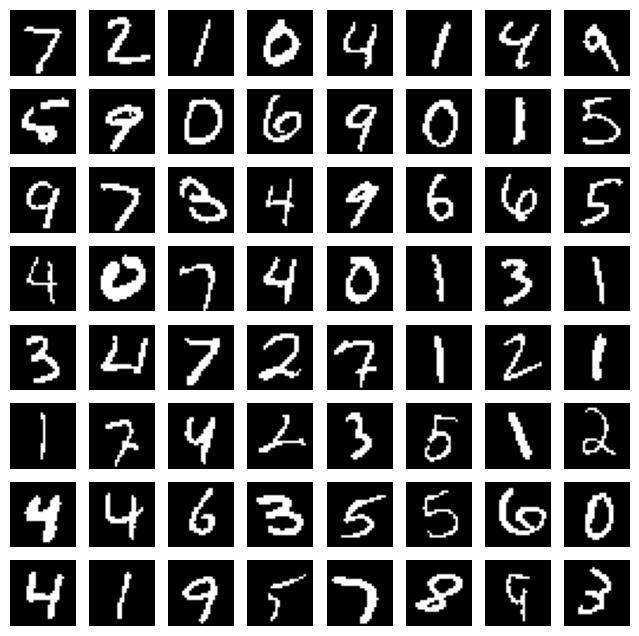

In [80]:
"""
Visualisation for the VAE
"""

vae_mnist.eval()
with torch.no_grad():
    data_iter = iter(test_loader)
    data, _ = next(data_iter)
    data = data.view(-1, 784).to(device)

    x_recon, mu, logvar = vae_mnist(data)
    x_recon = x_recon.view(-1, 1, 28, 28).cpu().numpy()
    data = data.view(-1, 1, 28, 28).cpu().numpy()

# Plot original vs. reconstructed
n = 64  # how many samples to visualize
fig, axes = plt.subplots(8, 8, figsize=(8, 8))
for i in range(8):
  for j in range(8):
    # original
    axes[i, j].imshow(data[i*8 + j, 0], cmap='gray')
    axes[i, j].axis('off')

plt.show()

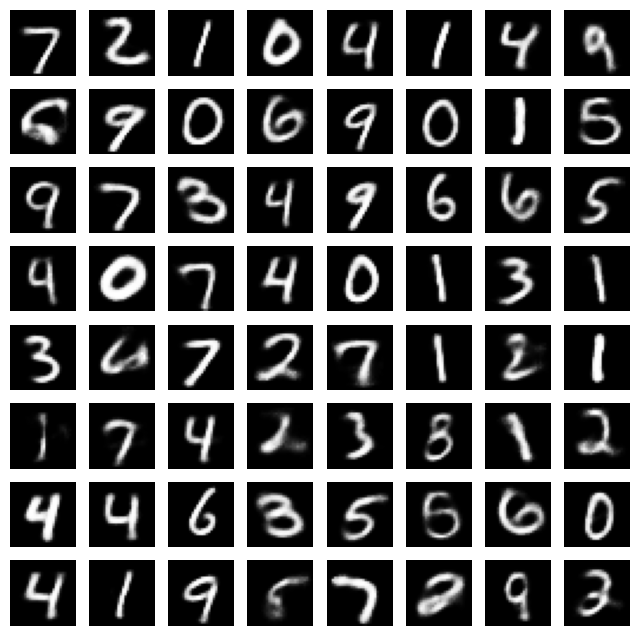

In [81]:
"""
Visualise the data reconstruction of the vae
"""

n = 8  # how many samples to visualize
fig, axes = plt.subplots(n, n, figsize=(8, 8))
for i in range(n):
  for j in range(n):
    # reconstruction
    axes[i, j].imshow(x_recon[i*8 + j, 0], cmap='gray')
    axes[i, j].axis('off')

The vae model recreates very well the data

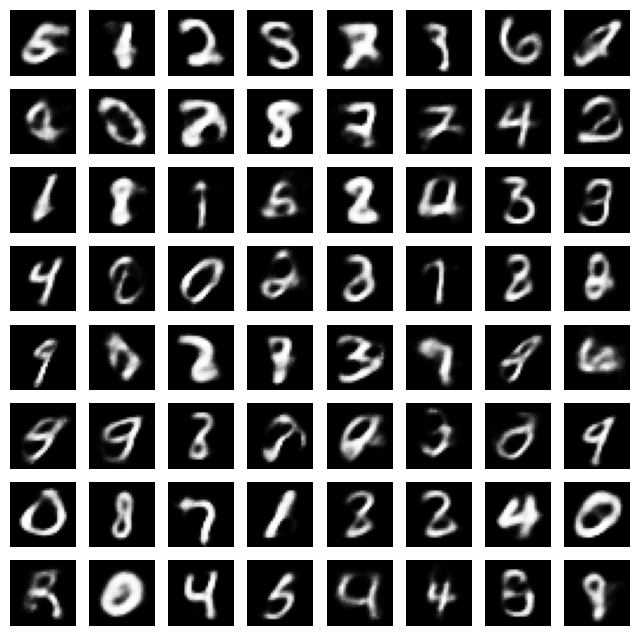

In [ ]:
"""
Visualisation new generated samples from the vae (not reconstructed data)
"""

# Generate new samples
with torch.no_grad():
    n_samples = 64  # 8x8 grid
    z = torch.randn(n_samples, z_dim).to(device)  # Sample from standard normal
    x_generated = vae_mnist.decoder(z)  # Pass through the decoder
    x_generated = x_generated.view(-1, 1, 28, 28).cpu().numpy()  # Reshape for plotting

# Plot the generated samples
fig, axes = plt.subplots(8, 8, figsize=(8, 8))
for i in range(8):
    for j in range(8):
        axes[i, j].imshow(x_generated[i*8 + j, 0], cmap='gray')
        axes[i, j].axis('off')

plt.show()

##Let's train the CONV VAE

In [ ]:
z_dim = 20
conv_vae = ConvVAE(z_dim=z_dim).to(device)
train_vae(conv_vae, train_loader, lr=1e-3, num_epochs=20, print_every=1, flatten=False)

100%|██████████| 469/469 [00:09<00:00, 47.91it/s]


Epoch [1/20] Loss: 105.069931


100%|██████████| 469/469 [00:08<00:00, 52.45it/s]


Epoch [2/20] Loss: 98.816467


100%|██████████| 469/469 [00:09<00:00, 51.96it/s]


Epoch [3/20] Loss: 103.526321


100%|██████████| 469/469 [00:08<00:00, 55.78it/s]


Epoch [4/20] Loss: 98.016815


100%|██████████| 469/469 [00:09<00:00, 51.77it/s]


Epoch [5/20] Loss: 96.861710


100%|██████████| 469/469 [00:09<00:00, 52.04it/s]


Epoch [6/20] Loss: 98.217247


100%|██████████| 469/469 [00:08<00:00, 53.17it/s]


Epoch [7/20] Loss: 95.771729


100%|██████████| 469/469 [00:08<00:00, 54.62it/s]


Epoch [8/20] Loss: 97.526855


100%|██████████| 469/469 [00:09<00:00, 52.08it/s]


Epoch [9/20] Loss: 95.607132


100%|██████████| 469/469 [00:09<00:00, 52.04it/s]


Epoch [10/20] Loss: 92.131454


100%|██████████| 469/469 [00:08<00:00, 55.21it/s]


Epoch [11/20] Loss: 92.518814


100%|██████████| 469/469 [00:08<00:00, 53.51it/s]


Epoch [12/20] Loss: 92.116722


100%|██████████| 469/469 [00:08<00:00, 52.18it/s]


Epoch [13/20] Loss: 93.697899


100%|██████████| 469/469 [00:08<00:00, 52.12it/s]


Epoch [14/20] Loss: 91.361542


100%|██████████| 469/469 [00:08<00:00, 56.11it/s]


Epoch [15/20] Loss: 93.915680


100%|██████████| 469/469 [00:08<00:00, 52.12it/s]


Epoch [16/20] Loss: 90.925034


100%|██████████| 469/469 [00:08<00:00, 52.17it/s]


Epoch [17/20] Loss: 88.886215


100%|██████████| 469/469 [00:09<00:00, 51.92it/s]


Epoch [18/20] Loss: 89.609726


100%|██████████| 469/469 [00:08<00:00, 55.61it/s]


Epoch [19/20] Loss: 92.798119


100%|██████████| 469/469 [00:09<00:00, 51.71it/s]

Epoch [20/20] Loss: 92.326691


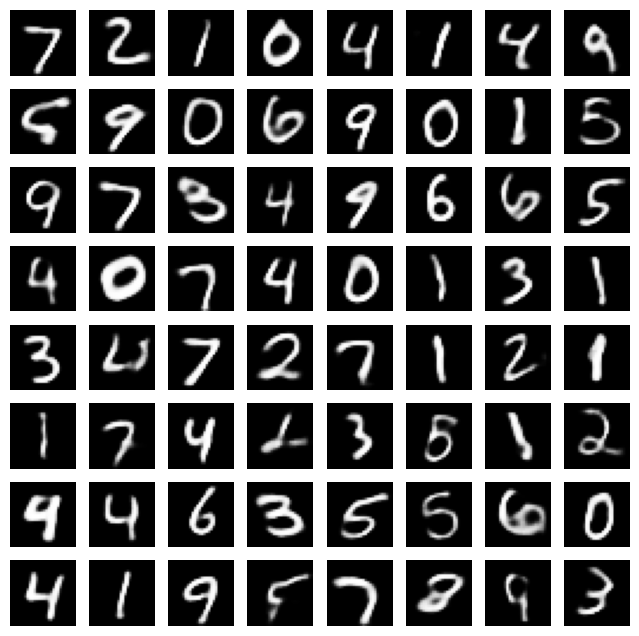

In [ ]:
"""
Visualise the data reconstruction of the conv vae
"""

conv_vae.eval()
with torch.no_grad():
    data_iter = iter(test_loader)
    data, _ = next(data_iter)
    data = data.to(device)

    x_recon, mu, logvar = conv_vae(data)
    x_recon = x_recon.cpu().numpy()
    data = data.cpu().numpy()

n = 8  # how many samples to visualize
fig, axes = plt.subplots(n, n, figsize=(8, 8))
for i in range(n):
  for j in range(n):
    # reconstruction
    axes[i, j].imshow(x_recon[i*8 + j, 0], cmap='gray')
    axes[i, j].axis('off')

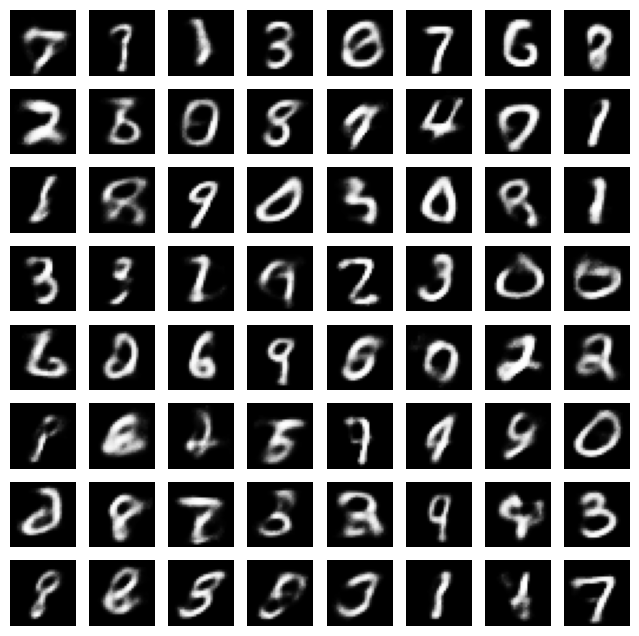

In [ ]:
"""
Visualisation new generated samples from the conv vae (not reconstructed data)
"""

# Generate new samples
with torch.no_grad():
    n_samples = 64  # 8x8 grid
    z = torch.randn(n_samples, z_dim).to(device)  # Sample from standard normal
    x_generated = vae_mnist.decoder(z)  # Pass through the decoder
    x_generated = x_generated.view(-1, 1, 28, 28).cpu().numpy()  # Reshape for plotting

# Plot the generated samples
fig, axes = plt.subplots(8, 8, figsize=(8, 8))
for i in range(8):
    for j in range(8):
        axes[i, j].imshow(x_generated[i*8 + j, 0], cmap='gray')
        axes[i, j].axis('off')

plt.show()

###WGAN for MNIST

In [ ]:
"""
Function to visualise images for the WGAN
"""

def imshow(img,size=None):
    img = img*0.5 + 0.5     # unnormalize
    if size is not None:
      img = transforms.Resize(size=size, interpolation=transforms.InterpolationMode.NEAREST, antialias=True)(img)
    pil_img = torchvision.transforms.functional.to_pil_image(img)
    display(pil_img)
    print("Image size (h x w): ",  pil_img.height, "x", pil_img.width)
    return None

In [ ]:
import os

batch_size=128
transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.5,), (0.5,))])
train_set = MNIST(os.getcwd(), train=True, transform=transform, download=True)
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=True)

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 9.91M/9.91M [00:00<00:00, 16.1MB/s]


Extracting /content/MNIST/raw/train-images-idx3-ubyte.gz to /content/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 28.9k/28.9k [00:00<00:00, 481kB/s]


Extracting /content/MNIST/raw/train-labels-idx1-ubyte.gz to /content/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 1.65M/1.65M [00:00<00:00, 4.47MB/s]


Extracting /content/MNIST/raw/t10k-images-idx3-ubyte.gz to /content/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 4.54k/4.54k [00:00<00:00, 6.50MB/s]

Extracting /content/MNIST/raw/t10k-labels-idx1-ubyte.gz to /content/MNIST/raw



In [ ]:
"""
Architecture of GAN for MNIST with conv layers
"""

# Size  of generator input
nz = 100

# Size of feature maps in generator and discriminator
ngf, ndf = 64, 64

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(in_channels = nz, out_channels = ngf * 8, kernel_size = 4, stride = 1, padding = 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(in_channels = ngf * 8, out_channels = ngf * 4, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(in_channels = ngf * 4, out_channels = ngf * 2, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(in_channels = ngf * 2, out_channels = ngf, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(in_channels = ngf, out_channels = 1, kernel_size=1, stride=1, padding=2, bias=False),
            nn.Tanh()
            # output size. 1 x 28 x 28
        )

    def forward(self, input):
        return self.main(input)


class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            # input is 1 x 28 x 28
            nn.Conv2d(in_channels = 1, out_channels = ndf, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 15 x 15
            nn.Conv2d(in_channels = ndf, out_channels= ndf * 2, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 8 x 8
            nn.Conv2d(in_channels = ndf * 2, out_channels = ndf * 4, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 5 x 5
            nn.Conv2d(in_channels = ndf * 4, out_channels = 1, kernel_size = 4, stride = 2, padding = 1, bias=False)
        )

    def forward(self, input):
        return self.main(input).view(-1, 1).squeeze(1)


In [ ]:
"""
Weight initialisation
"""


def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
"""
Function to visualise generated images
"""

def show(G,z=None,batch_size=128,nz=100):
  # provide random latent code as option to see evolution
  with torch.no_grad():
    if z==None:
      z = torch.randn(batch_size,nz,1,1).to(device)
    genimages = G(z)
    pil_img = imshow(torchvision.utils.make_grid(genimages.to('cpu'),nrow=16))
    return(pil_img)

In [ ]:
"""
Lipschitz constant and gradient penalty for wgan (we're not going to try weight
clipping, we're directly going for gradient penalty)
"""


def lipconstant(D,x,y):
    # Calculate interpolation
    b = x.shape[0]
    alpha = torch.rand((b, 1, 1, 1), device=device)
    interp = alpha * y + (1 - alpha) * x
    interp.requires_grad_()

    # Calculate discriminator on interpolated examples
    Di = D(interp).view(-1)

    # Calculate gradients of probabilities with respect to examples
    gradients = torch.autograd.grad(
        outputs=Di,
        inputs=interp,
        grad_outputs=torch.ones(Di.size()).to(device),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]

    # Derivatives of the gradient close to 0 can cause problems because of
    # the square root, so manually calculate norm and add epsilon
    gradients_norm = torch.sqrt(torch.sum(gradients**2, dim=1)+1e-8) + 1e-12

    # Return gradient penalty
    return torch.mean(gradients_norm)

def gradient_penalty(D,x,y):
    # Calculate interpolation
    alpha = torch.rand((x.shape[0], 1, 1, 1), device=device)
    interp = alpha * y + (1 - alpha) * x
    interp.requires_grad_()

    Di = D(interp).view(-1)

    # Calculate gradients of probabilities with respect to examples
    gradients = torch.autograd.grad(outputs=Di,
        inputs=interp,
        grad_outputs=torch.ones(Di.size()).to(device),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]

    # Derivatives of the gradient close to 0 can cause problems because of
    # the square root, so manually calculate norm and add epsilon
    gradients_norm = torch.sqrt(torch.sum(gradients**2, dim=1) + 1e-8) + 1e-8


    # Return gradient penalty
    return ((gradients_norm - 1) ** 2).mean()


[1/5][0/468][0.2098 s]	Loss_D: -0.2094	Loss_G: 0.1102	


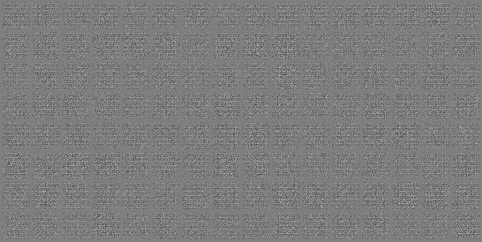

Image size (h x w):  242 x 482
[1/5][10/468][1.1686 s]	Loss_D: -4.0963	Loss_G: -3.1323	
[1/5][20/468][2.0247 s]	Loss_D: -2.2231	Loss_G: -5.6793	
[1/5][30/468][2.8856 s]	Loss_D: -8.4068	Loss_G: 2.6345	
[1/5][40/468][3.7418 s]	Loss_D: -7.3707	Loss_G: 1.1084	
[1/5][50/468][4.6030 s]	Loss_D: -16.1796	Loss_G: 11.2439	
[1/5][60/468][5.4633 s]	Loss_D: -10.5969	Loss_G: 5.6259	
[1/5][70/468][6.3239 s]	Loss_D: -4.5616	Loss_G: -3.5126	
[1/5][80/468][7.1833 s]	Loss_D: -9.0697	Loss_G: 3.2782	
[1/5][90/468][8.0429 s]	Loss_D: -14.1971	Loss_G: 9.6373	
[1/5][100/468][8.9040 s]	Loss_D: -12.4234	Loss_G: 11.4664	


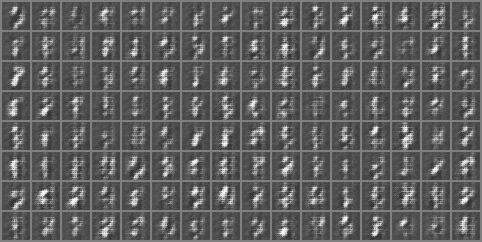

Image size (h x w):  242 x 482
[1/5][110/468][9.8204 s]	Loss_D: -11.9989	Loss_G: 12.6494	
[1/5][120/468][10.6885 s]	Loss_D: -15.9545	Loss_G: 14.2861	
[1/5][130/468][11.5692 s]	Loss_D: -19.8419	Loss_G: 8.3266	
[1/5][140/468][12.4677 s]	Loss_D: -27.0805	Loss_G: 17.3108	
[1/5][150/468][13.3182 s]	Loss_D: -21.2256	Loss_G: 17.4404	
[1/5][160/468][14.1849 s]	Loss_D: -18.0324	Loss_G: 31.1123	
[1/5][170/468][15.0487 s]	Loss_D: -35.4950	Loss_G: 23.5405	
[1/5][180/468][15.9147 s]	Loss_D: -33.8864	Loss_G: 38.4720	
[1/5][190/468][16.7818 s]	Loss_D: -37.8410	Loss_G: 34.0331	
[1/5][200/468][17.6497 s]	Loss_D: -36.3091	Loss_G: 26.2158	


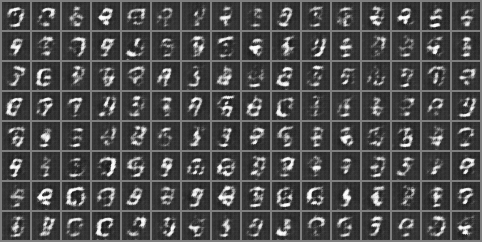

Image size (h x w):  242 x 482
[1/5][210/468][18.5611 s]	Loss_D: -33.4068	Loss_G: 19.6716	
[1/5][220/468][19.4310 s]	Loss_D: -57.2494	Loss_G: 27.6033	
[1/5][230/468][20.3010 s]	Loss_D: -38.5536	Loss_G: 47.0827	
[1/5][240/468][21.1724 s]	Loss_D: -54.3502	Loss_G: 51.5443	
[1/5][250/468][22.0457 s]	Loss_D: -65.3752	Loss_G: 54.7756	
[1/5][260/468][22.9265 s]	Loss_D: -55.5844	Loss_G: 56.8447	
[1/5][270/468][23.8265 s]	Loss_D: -72.7918	Loss_G: 18.0496	
[1/5][280/468][24.6979 s]	Loss_D: -88.3637	Loss_G: 35.4134	
[1/5][290/468][25.5743 s]	Loss_D: -46.2920	Loss_G: 57.0579	
[1/5][300/468][26.4429 s]	Loss_D: -73.5674	Loss_G: 46.5152	


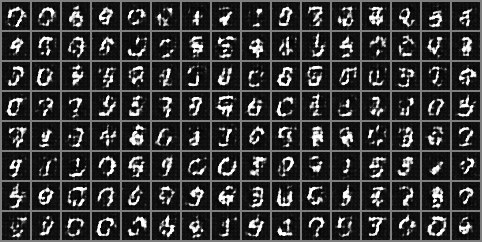

Image size (h x w):  242 x 482
[1/5][310/468][27.3677 s]	Loss_D: -90.4300	Loss_G: 43.4924	
[1/5][320/468][28.2428 s]	Loss_D: -75.1084	Loss_G: 75.1568	
[1/5][330/468][29.1185 s]	Loss_D: -60.5784	Loss_G: 70.8404	
[1/5][340/468][29.9914 s]	Loss_D: -77.9146	Loss_G: 63.1199	
[1/5][350/468][30.8693 s]	Loss_D: -52.0752	Loss_G: 32.9983	
[1/5][360/468][31.7443 s]	Loss_D: -48.7815	Loss_G: 9.1628	
[1/5][370/468][32.6225 s]	Loss_D: -60.4690	Loss_G: 38.9050	
[1/5][380/468][33.5029 s]	Loss_D: -69.5335	Loss_G: 73.3388	
[1/5][390/468][34.3932 s]	Loss_D: -61.9053	Loss_G: 61.5826	
[1/5][400/468][35.2691 s]	Loss_D: -70.7263	Loss_G: 69.2186	


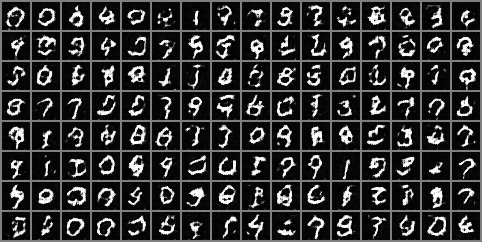

Image size (h x w):  242 x 482
[1/5][410/468][36.2294 s]	Loss_D: -39.6885	Loss_G: 32.0515	
[1/5][420/468][37.1178 s]	Loss_D: -91.3257	Loss_G: 72.8254	
[1/5][430/468][37.9949 s]	Loss_D: -31.7717	Loss_G: 64.4113	
[1/5][440/468][38.8726 s]	Loss_D: -56.5624	Loss_G: 66.1255	
[1/5][450/468][39.7556 s]	Loss_D: -82.4202	Loss_G: 77.2370	
[1/5][460/468][40.6293 s]	Loss_D: -45.9383	Loss_G: 67.2593	
[2/5][0/468][41.4773 s]	Loss_D: -46.5541	Loss_G: 1.9302	


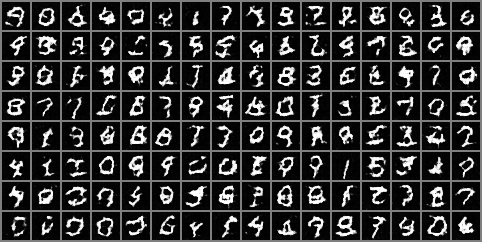

Image size (h x w):  242 x 482
[2/5][10/468][42.3846 s]	Loss_D: -56.5724	Loss_G: 34.7073	
[2/5][20/468][43.2652 s]	Loss_D: -54.3070	Loss_G: 50.8392	
[2/5][30/468][44.1481 s]	Loss_D: -24.3034	Loss_G: -17.0428	
[2/5][40/468][45.0323 s]	Loss_D: -50.4485	Loss_G: 80.5811	
[2/5][50/468][45.9188 s]	Loss_D: -49.2106	Loss_G: 45.6113	
[2/5][60/468][46.8006 s]	Loss_D: -50.3559	Loss_G: 72.7246	
[2/5][70/468][47.7005 s]	Loss_D: -42.1038	Loss_G: 39.4011	
[2/5][80/468][48.6046 s]	Loss_D: -22.3583	Loss_G: 3.9049	
[2/5][90/468][49.4976 s]	Loss_D: -33.2585	Loss_G: 82.6602	
[2/5][100/468][50.3826 s]	Loss_D: -39.2230	Loss_G: -11.5706	


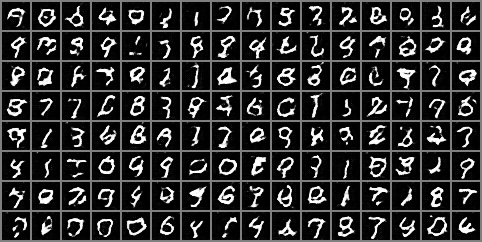

Image size (h x w):  242 x 482
[2/5][110/468][51.3102 s]	Loss_D: -24.8033	Loss_G: 19.9424	
[2/5][120/468][52.1994 s]	Loss_D: -25.0000	Loss_G: -21.9236	
[2/5][130/468][53.0833 s]	Loss_D: -24.3033	Loss_G: 8.0454	
[2/5][140/468][53.9738 s]	Loss_D: -27.9569	Loss_G: 30.1667	
[2/5][150/468][54.8602 s]	Loss_D: -60.3883	Loss_G: -2.0994	
[2/5][160/468][55.7467 s]	Loss_D: -16.8328	Loss_G: -11.8883	
[2/5][170/468][56.6346 s]	Loss_D: -56.7096	Loss_G: 34.2741	
[2/5][180/468][57.5229 s]	Loss_D: -36.8852	Loss_G: 43.4794	
[2/5][190/468][58.4152 s]	Loss_D: -27.3271	Loss_G: 27.2331	
[2/5][200/468][59.3172 s]	Loss_D: -25.9442	Loss_G: -8.9963	


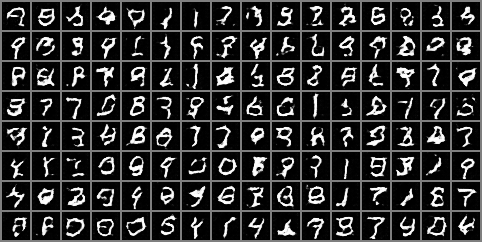

Image size (h x w):  242 x 482
[2/5][210/468][60.2657 s]	Loss_D: -40.3594	Loss_G: 62.3854	
[2/5][220/468][61.1858 s]	Loss_D: -52.6663	Loss_G: 44.5992	
[2/5][230/468][62.0761 s]	Loss_D: -40.1753	Loss_G: 67.9250	
[2/5][240/468][62.9669 s]	Loss_D: -36.3468	Loss_G: 41.0665	
[2/5][250/468][63.8629 s]	Loss_D: -27.9357	Loss_G: 21.9420	
[2/5][260/468][64.7553 s]	Loss_D: -58.1883	Loss_G: 60.3363	
[2/5][270/468][65.6466 s]	Loss_D: -6.9986	Loss_G: 34.2965	
[2/5][280/468][66.5414 s]	Loss_D: -40.7415	Loss_G: 57.7990	
[2/5][290/468][67.4364 s]	Loss_D: -68.0737	Loss_G: 46.3625	
[2/5][300/468][68.3321 s]	Loss_D: -30.3213	Loss_G: 29.2904	


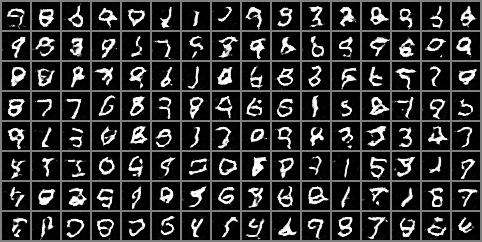

Image size (h x w):  242 x 482
[2/5][310/468][69.2717 s]	Loss_D: -25.9505	Loss_G: 25.1539	
[2/5][320/468][70.1691 s]	Loss_D: -4.6286	Loss_G: -11.3995	
[2/5][330/468][71.0628 s]	Loss_D: -37.3754	Loss_G: 41.2670	
[2/5][340/468][71.9768 s]	Loss_D: 6.0139	Loss_G: -5.7157	
[2/5][350/468][72.8849 s]	Loss_D: -40.6452	Loss_G: 59.0063	
[2/5][360/468][73.7958 s]	Loss_D: -22.3313	Loss_G: 53.0181	
[2/5][370/468][74.6955 s]	Loss_D: -38.6285	Loss_G: 57.9053	
[2/5][380/468][75.5943 s]	Loss_D: -21.4401	Loss_G: -26.5839	
[2/5][390/468][76.4932 s]	Loss_D: -15.8149	Loss_G: 32.2054	
[2/5][400/468][77.3936 s]	Loss_D: -50.1556	Loss_G: 43.7480	


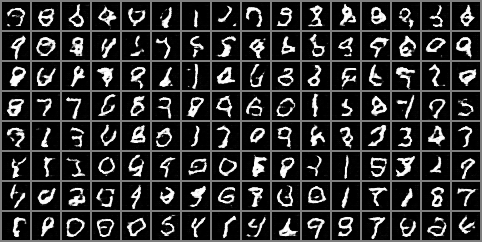

Image size (h x w):  242 x 482
[2/5][410/468][78.3313 s]	Loss_D: -18.4822	Loss_G: 18.6968	
[2/5][420/468][79.2366 s]	Loss_D: -41.3307	Loss_G: 102.0361	
[2/5][430/468][80.1351 s]	Loss_D: -19.4685	Loss_G: -26.7387	
[2/5][440/468][81.0402 s]	Loss_D: -43.2817	Loss_G: 52.0622	
[2/5][450/468][81.9496 s]	Loss_D: -48.5534	Loss_G: 53.0424	
[2/5][460/468][82.8509 s]	Loss_D: -7.8090	Loss_G: -8.2334	
[3/5][0/468][83.7237 s]	Loss_D: -30.9307	Loss_G: 36.5035	


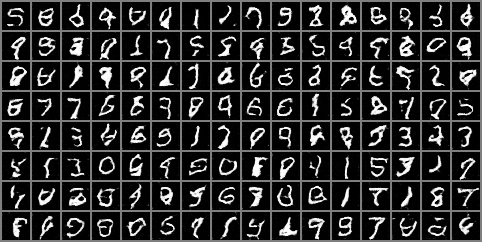

Image size (h x w):  242 x 482
[3/5][10/468][84.6683 s]	Loss_D: -34.5560	Loss_G: 36.7216	
[3/5][20/468][85.5905 s]	Loss_D: -10.0580	Loss_G: -13.2487	
[3/5][30/468][86.5030 s]	Loss_D: -31.7375	Loss_G: 4.6435	
[3/5][40/468][87.4087 s]	Loss_D: -30.0617	Loss_G: 49.5551	
[3/5][50/468][88.3158 s]	Loss_D: -34.7003	Loss_G: 51.9588	
[3/5][60/468][89.2190 s]	Loss_D: -52.7091	Loss_G: 44.5089	
[3/5][70/468][90.1228 s]	Loss_D: -42.0747	Loss_G: 5.4752	
[3/5][80/468][91.0294 s]	Loss_D: -14.9726	Loss_G: -7.5591	
[3/5][90/468][91.9389 s]	Loss_D: -4.7758	Loss_G: -1.5310	
[3/5][100/468][92.8479 s]	Loss_D: -31.5934	Loss_G: 21.2144	


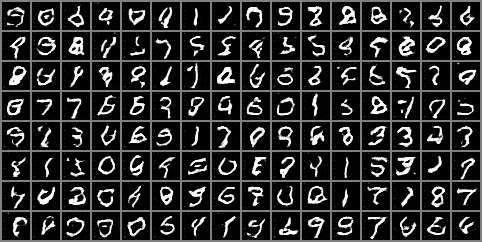

Image size (h x w):  242 x 482
[3/5][110/468][93.8049 s]	Loss_D: -45.6464	Loss_G: 68.2959	
[3/5][120/468][94.7136 s]	Loss_D: -21.7594	Loss_G: -3.0971	
[3/5][130/468][95.6254 s]	Loss_D: -12.1390	Loss_G: 51.1441	
[3/5][140/468][96.5396 s]	Loss_D: -0.5605	Loss_G: -19.9862	
[3/5][150/468][97.4523 s]	Loss_D: -1.2041	Loss_G: 45.5602	
[3/5][160/468][98.3902 s]	Loss_D: -11.5870	Loss_G: -3.1962	
[3/5][170/468][99.2919 s]	Loss_D: -42.0019	Loss_G: 40.9463	
[3/5][180/468][100.1999 s]	Loss_D: -29.3092	Loss_G: 66.8931	
[3/5][190/468][101.1093 s]	Loss_D: -37.6254	Loss_G: 1.3938	
[3/5][200/468][102.0151 s]	Loss_D: -59.8480	Loss_G: 65.7868	


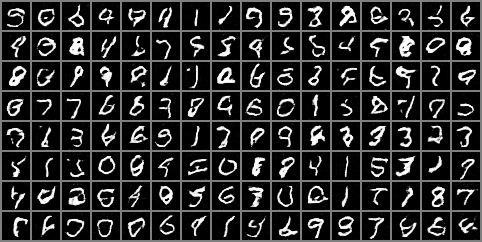

Image size (h x w):  242 x 482
[3/5][210/468][102.9624 s]	Loss_D: -8.5101	Loss_G: -82.3687	
[3/5][220/468][103.8747 s]	Loss_D: -33.1715	Loss_G: 73.7691	
[3/5][230/468][104.7827 s]	Loss_D: -36.5099	Loss_G: 35.3165	
[3/5][240/468][105.6922 s]	Loss_D: 16.8100	Loss_G: 3.7079	
[3/5][250/468][106.6019 s]	Loss_D: -4.6779	Loss_G: -16.5977	
[3/5][260/468][107.5135 s]	Loss_D: -17.8749	Loss_G: 4.9480	
[3/5][270/468][108.4230 s]	Loss_D: -13.6398	Loss_G: 43.6576	
[3/5][280/468][109.3424 s]	Loss_D: -10.4028	Loss_G: -7.0257	
[3/5][290/468][110.2569 s]	Loss_D: -23.0140	Loss_G: -4.2435	
[3/5][300/468][111.1850 s]	Loss_D: -31.0926	Loss_G: 62.8523	


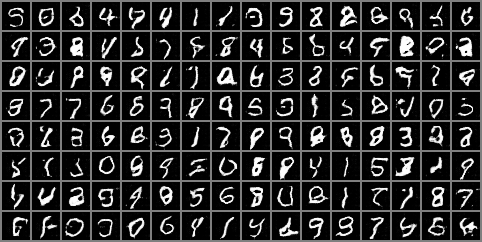

Image size (h x w):  242 x 482
[3/5][310/468][112.1263 s]	Loss_D: -38.2777	Loss_G: 51.2629	
[3/5][320/468][113.0379 s]	Loss_D: -46.0305	Loss_G: 31.4462	
[3/5][330/468][113.9522 s]	Loss_D: -46.7172	Loss_G: 48.6349	
[3/5][340/468][114.8606 s]	Loss_D: -43.2430	Loss_G: 86.7839	
[3/5][350/468][115.7701 s]	Loss_D: -20.2923	Loss_G: 143.0360	
[3/5][360/468][116.6808 s]	Loss_D: -39.9538	Loss_G: 6.9265	
[3/5][370/468][117.5916 s]	Loss_D: -32.1604	Loss_G: 91.7979	
[3/5][380/468][118.5276 s]	Loss_D: -24.2738	Loss_G: -22.2859	
[3/5][390/468][119.4371 s]	Loss_D: -34.7205	Loss_G: 39.3697	
[3/5][400/468][120.3451 s]	Loss_D: -30.6288	Loss_G: 24.4147	


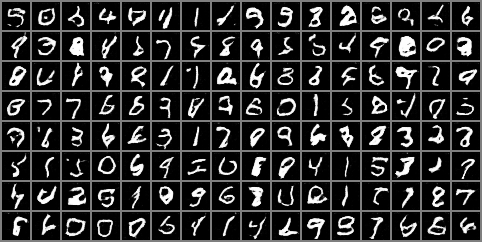

Image size (h x w):  242 x 482
[3/5][410/468][121.3034 s]	Loss_D: -40.5454	Loss_G: 59.8338	
[3/5][420/468][122.2224 s]	Loss_D: -33.0190	Loss_G: -2.5377	
[3/5][430/468][123.1447 s]	Loss_D: -30.9251	Loss_G: 46.7462	
[3/5][440/468][124.0679 s]	Loss_D: -35.6503	Loss_G: 38.1323	
[3/5][450/468][124.9857 s]	Loss_D: -22.9743	Loss_G: -61.9908	
[3/5][460/468][125.8907 s]	Loss_D: -18.7878	Loss_G: 4.2794	
[4/5][0/468][126.7779 s]	Loss_D: -29.0395	Loss_G: 49.6817	


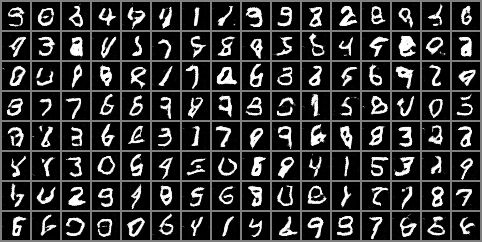

Image size (h x w):  242 x 482
[4/5][10/468][127.7211 s]	Loss_D: -63.7418	Loss_G: 100.5686	
[4/5][20/468][128.6331 s]	Loss_D: -54.4752	Loss_G: 60.6456	
[4/5][30/468][129.5508 s]	Loss_D: -3.7556	Loss_G: 122.4283	
[4/5][40/468][130.4632 s]	Loss_D: -24.2778	Loss_G: -52.5738	
[4/5][50/468][131.3736 s]	Loss_D: -35.3170	Loss_G: 8.4441	
[4/5][60/468][132.2847 s]	Loss_D: -46.4794	Loss_G: 61.0253	
[4/5][70/468][133.1967 s]	Loss_D: -66.5306	Loss_G: 45.5392	
[4/5][80/468][134.1163 s]	Loss_D: -67.4665	Loss_G: 80.6938	
[4/5][90/468][135.0410 s]	Loss_D: -21.2060	Loss_G: -20.7240	
[4/5][100/468][135.9682 s]	Loss_D: -27.7790	Loss_G: 53.9475	


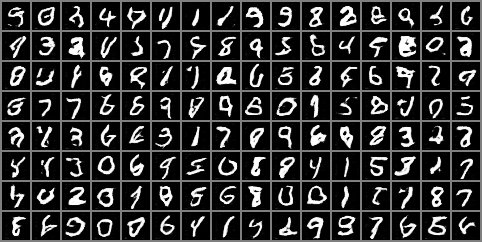

Image size (h x w):  242 x 482
[4/5][110/468][136.9229 s]	Loss_D: -10.8856	Loss_G: 88.5753	
[4/5][120/468][137.8408 s]	Loss_D: -8.0576	Loss_G: -56.8539	
[4/5][130/468][138.7532 s]	Loss_D: -58.5033	Loss_G: 82.1873	
[4/5][140/468][139.6658 s]	Loss_D: -28.4746	Loss_G: 77.4528	
[4/5][150/468][140.5783 s]	Loss_D: -22.8482	Loss_G: 74.7931	
[4/5][160/468][141.4898 s]	Loss_D: -48.0667	Loss_G: 59.9962	
[4/5][170/468][142.3987 s]	Loss_D: -30.4887	Loss_G: 78.9710	
[4/5][180/468][143.3097 s]	Loss_D: -4.6761	Loss_G: 96.5401	
[4/5][190/468][144.2203 s]	Loss_D: -23.5051	Loss_G: 45.9298	
[4/5][200/468][145.1323 s]	Loss_D: -51.3446	Loss_G: -6.0512	


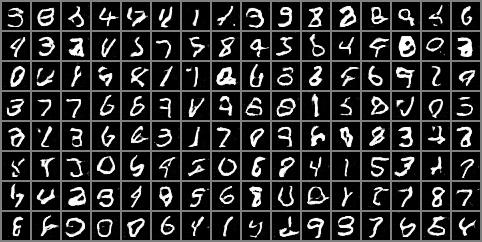

Image size (h x w):  242 x 482
[4/5][210/468][146.0921 s]	Loss_D: -34.5686	Loss_G: 18.1761	
[4/5][220/468][147.0177 s]	Loss_D: -42.6694	Loss_G: 63.6232	
[4/5][230/468][147.9555 s]	Loss_D: -35.5199	Loss_G: -3.5064	
[4/5][240/468][148.8942 s]	Loss_D: 5.6797	Loss_G: 63.9330	
[4/5][250/468][149.8061 s]	Loss_D: -17.5242	Loss_G: 6.3539	
[4/5][260/468][150.7231 s]	Loss_D: -21.8335	Loss_G: -54.4218	
[4/5][270/468][151.6366 s]	Loss_D: -38.9499	Loss_G: 31.8705	
[4/5][280/468][152.5546 s]	Loss_D: -17.5823	Loss_G: -9.8985	
[4/5][290/468][153.4781 s]	Loss_D: -26.5647	Loss_G: 75.2924	
[4/5][300/468][154.3883 s]	Loss_D: -26.4030	Loss_G: -18.7871	


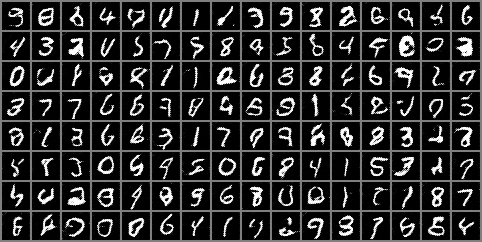

Image size (h x w):  242 x 482
[4/5][310/468][155.3609 s]	Loss_D: -46.9629	Loss_G: 74.3174	
[4/5][320/468][156.2710 s]	Loss_D: -15.8175	Loss_G: 24.7961	
[4/5][330/468][157.1884 s]	Loss_D: -26.7941	Loss_G: 111.4456	
[4/5][340/468][158.1096 s]	Loss_D: -36.6513	Loss_G: 144.8440	
[4/5][350/468][159.0308 s]	Loss_D: -10.8781	Loss_G: -16.6463	
[4/5][360/468][159.9599 s]	Loss_D: -22.0434	Loss_G: 25.6260	
[4/5][370/468][160.9002 s]	Loss_D: -27.7369	Loss_G: -9.5318	
[4/5][380/468][161.8167 s]	Loss_D: -31.1982	Loss_G: 94.5486	
[4/5][390/468][162.7376 s]	Loss_D: -12.6756	Loss_G: 20.5741	
[4/5][400/468][163.6564 s]	Loss_D: -39.1123	Loss_G: 60.8131	


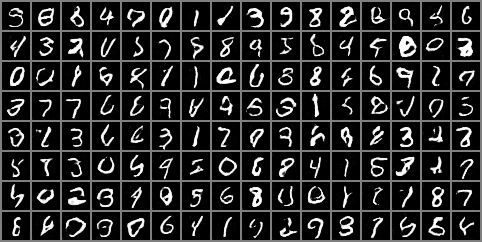

Image size (h x w):  242 x 482
[4/5][410/468][164.6207 s]	Loss_D: -39.4850	Loss_G: 38.3519	
[4/5][420/468][165.5440 s]	Loss_D: 0.4969	Loss_G: 10.9072	
[4/5][430/468][166.4684 s]	Loss_D: -51.4803	Loss_G: 69.0794	
[4/5][440/468][167.3881 s]	Loss_D: -30.4670	Loss_G: 29.5453	
[4/5][450/468][168.3101 s]	Loss_D: -24.9869	Loss_G: 63.5661	
[4/5][460/468][169.2304 s]	Loss_D: -30.0512	Loss_G: 78.8714	
[5/5][0/468][170.1203 s]	Loss_D: -45.4739	Loss_G: 107.0492	


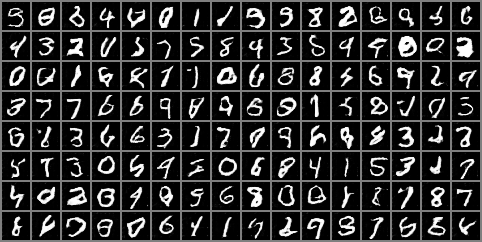

Image size (h x w):  242 x 482
[5/5][10/468][171.0792 s]	Loss_D: -22.4075	Loss_G: 39.2903	
[5/5][20/468][172.0137 s]	Loss_D: -69.6634	Loss_G: 14.5328	
[5/5][30/468][172.9507 s]	Loss_D: -61.3772	Loss_G: 142.1550	
[5/5][40/468][173.8795 s]	Loss_D: -37.1288	Loss_G: -47.1884	
[5/5][50/468][174.8056 s]	Loss_D: -17.7946	Loss_G: -61.4050	
[5/5][60/468][175.7274 s]	Loss_D: -37.7129	Loss_G: 65.7006	
[5/5][70/468][176.6532 s]	Loss_D: -46.8107	Loss_G: 3.9368	
[5/5][80/468][177.5780 s]	Loss_D: -28.0030	Loss_G: -24.0858	
[5/5][90/468][178.5010 s]	Loss_D: -34.7244	Loss_G: 55.1415	
[5/5][100/468][179.4268 s]	Loss_D: -61.4987	Loss_G: 30.1868	


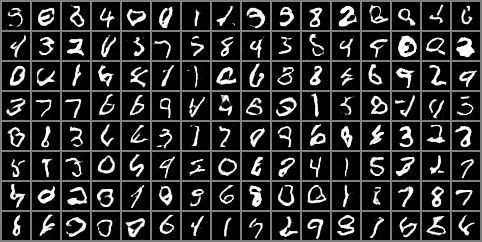

Image size (h x w):  242 x 482
[5/5][110/468][180.4060 s]	Loss_D: -39.1793	Loss_G: -26.4849	
[5/5][120/468][181.3287 s]	Loss_D: -15.8626	Loss_G: 73.5105	
[5/5][130/468][182.2592 s]	Loss_D: -2.5439	Loss_G: 20.6088	
[5/5][140/468][183.1836 s]	Loss_D: -42.0099	Loss_G: -15.5421	
[5/5][150/468][184.1165 s]	Loss_D: -27.4178	Loss_G: -23.2921	
[5/5][160/468][185.0722 s]	Loss_D: -26.6418	Loss_G: 36.6721	
[5/5][170/468][186.0259 s]	Loss_D: -27.4356	Loss_G: 15.3745	
[5/5][180/468][186.9451 s]	Loss_D: -18.1081	Loss_G: 42.3193	
[5/5][190/468][187.8743 s]	Loss_D: -25.0899	Loss_G: 61.6406	
[5/5][200/468][188.8012 s]	Loss_D: -36.5433	Loss_G: 42.6780	


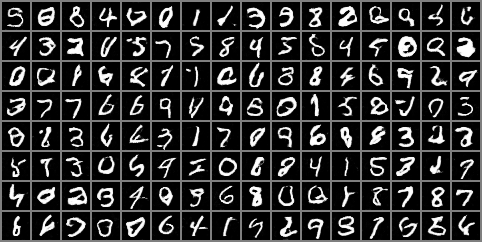

Image size (h x w):  242 x 482
[5/5][210/468][189.7848 s]	Loss_D: -55.0868	Loss_G: 4.5942	
[5/5][220/468][190.7104 s]	Loss_D: -41.4734	Loss_G: 35.9683	
[5/5][230/468][191.6380 s]	Loss_D: -42.0475	Loss_G: 156.1507	
[5/5][240/468][192.5705 s]	Loss_D: -23.5952	Loss_G: -6.2463	
[5/5][250/468][193.4986 s]	Loss_D: -27.8202	Loss_G: 11.1868	
[5/5][260/468][194.4223 s]	Loss_D: -33.6873	Loss_G: 20.3972	
[5/5][270/468][195.3519 s]	Loss_D: -4.8035	Loss_G: -87.7465	
[5/5][280/468][196.2892 s]	Loss_D: -10.1573	Loss_G: -46.7639	
[5/5][290/468][197.2296 s]	Loss_D: -8.1143	Loss_G: 81.4833	
[5/5][300/468][198.1773 s]	Loss_D: -29.1596	Loss_G: 64.2798	


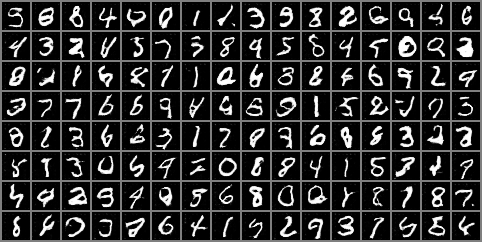

Image size (h x w):  242 x 482
[5/5][310/468][199.1604 s]	Loss_D: -34.4420	Loss_G: -5.3507	
[5/5][320/468][200.0969 s]	Loss_D: -31.6550	Loss_G: 74.5912	
[5/5][330/468][201.0286 s]	Loss_D: -51.5315	Loss_G: 3.0655	
[5/5][340/468][201.9566 s]	Loss_D: -1.1773	Loss_G: 32.2224	
[5/5][350/468][202.8860 s]	Loss_D: -29.8299	Loss_G: 15.5870	
[5/5][360/468][203.8162 s]	Loss_D: -20.7208	Loss_G: 67.9162	
[5/5][370/468][204.7488 s]	Loss_D: -20.3629	Loss_G: -78.8241	
[5/5][380/468][205.6773 s]	Loss_D: -5.9414	Loss_G: 63.3542	
[5/5][390/468][206.6068 s]	Loss_D: -32.4198	Loss_G: 13.1366	
[5/5][400/468][207.5378 s]	Loss_D: 37.1122	Loss_G: -20.9848	


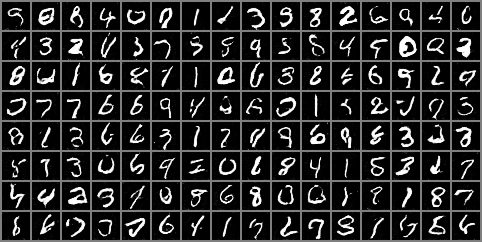

Image size (h x w):  242 x 482
[5/5][410/468][208.5154 s]	Loss_D: -23.2304	Loss_G: 49.4084	
[5/5][420/468][209.4624 s]	Loss_D: -53.9905	Loss_G: 7.0916	
[5/5][430/468][210.4174 s]	Loss_D: 15.5798	Loss_G: 27.4110	
[5/5][440/468][211.3542 s]	Loss_D: -4.7995	Loss_G: 35.3699	
[5/5][450/468][212.2860 s]	Loss_D: -38.9316	Loss_G: -12.1278	
[5/5][460/468][213.2188 s]	Loss_D: -36.5797	Loss_G: 29.3622	
Total learning time =  213.92193031311035


In [ ]:
"""
Training of the WGAN
"""

torch.manual_seed(1)  # initialize random seed for reproducibility

num_epochs = 5
log_every = 10
gpw = 0.1

G = Generator().to(device)
D = Discriminator().to(device)
G.apply(weights_init);
D.apply(weights_init);
optimD = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimG = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))

zviz = torch.randn(batch_size,nz,1,1).to(device)

t0 = time.time()
for epoch in range(num_epochs):
    # For each batch in the train_loader
    for i, (batch, _) in enumerate(train_loader, 0):

        real = batch.to(device)
        z = torch.randn(128, nz, 1, 1, device=device)

        faked = G(z).detach()
        optimD.zero_grad()
        Dloss = D(faked).mean() - D(real).mean() + gpw*gradient_penalty(D, faked, real)
        Dloss.backward()
        optimD.step()

        z = torch.randn(128, nz, 1, 1, device=device)
        faked = G(z)
        optimG.zero_grad()
        Gloss = - D(faked).mean()
        Gloss.backward()
        optimG.step()

        if i % log_every == 0:
            print('[%d/%d][%d/%d][%.4f s]\tLoss_D: %.4f\tLoss_G: %.4f\t'
                  % (epoch+1, num_epochs, i, len(train_loader), time.time()-t0, Dloss.item(), Gloss.item()))
        if i % 100 == 0:
            show(G,zviz)

print('Total learning time = ',time.time()-t0)

# Save final generator in a variable for later use
wgan = Generator()
wgan.load_state_dict(G.state_dict())

# Save final generator in a file
torch.save(G.state_dict(), 'wgan.pt')

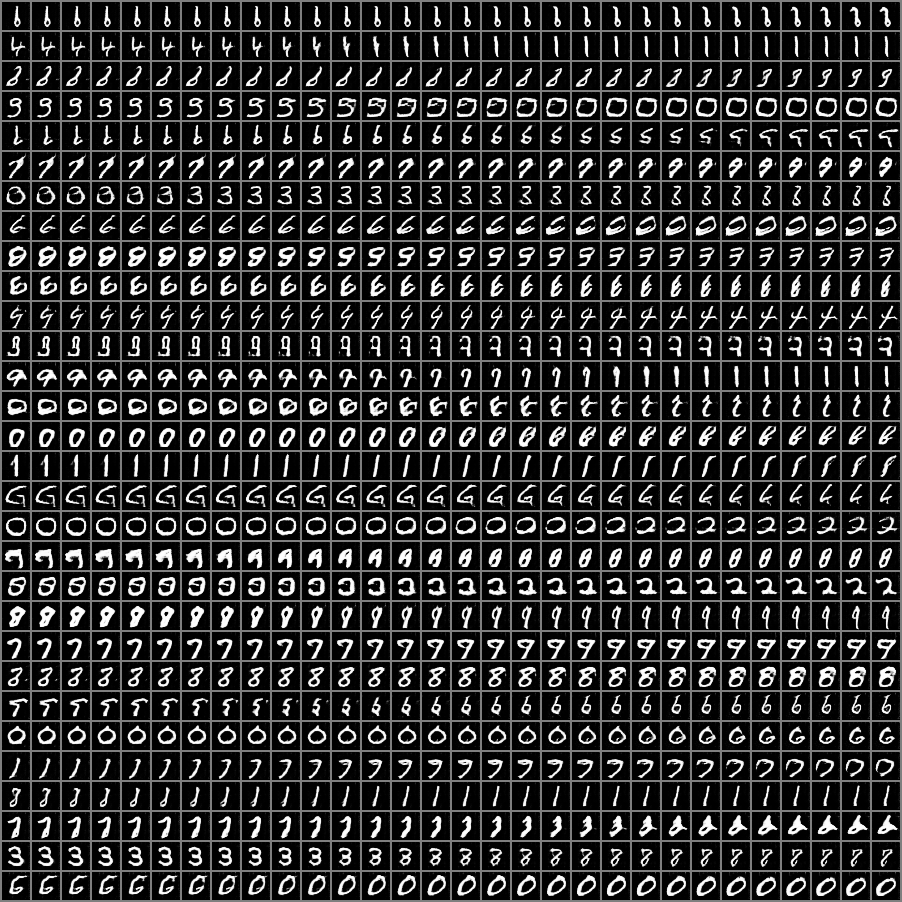

Image size (h x w):  902 x 902


In [ ]:
"""
Evaluation of the WGAN with visualisation
"""

G.eval();  # Turn generator in evaluation mode to fix BatchNorm layers

minib = 30    # number of latent variables
nk = 30       # number of alpha values

z0 = torch.randn(minib, 1, nz, 1, 1).to(device)
z1 = torch.randn(minib, 1, nz, 1, 1).to(device)
alpha = torch.linspace(0,1,nk).to(device)[None, :, None, None, None]

z = torch.flatten(z0*(1-alpha) + z1*alpha, start_dim=0, end_dim=1)

genimages = G(z)

pil_img = imshow(torchvision.utils.make_grid(genimages.to('cpu'),nrow=nk))

***
##Question 3.a.
The images are clearly better with the WGAN. We could have guessed it knowing the difference in model complexity (even though we know it doesn't do everything). The VAE has problem recreating some numbers, some don't make any sense

##Question 3.b.
Favor VAE over WGANS : algorithm way simpler and i know we could get better results with a little bit of effort. training is faster

##Question 4.a.

The Fréchet Inception Distance uses features learned from large, colored, natural images. It is is optimized for high-level features of large natural images That is a poor fit for simple grayscale digits (MNIST) and low resolution (28×28). A more suitable adaptation is to replace the Inception network with a domain‐specific feature extractor. We're going to train a CNN on MNIST and compute the Fréchet distance between real vs. generated samples in that MNIST‐trained CNN’s feature space.

##Question 4.b.
We could use a digit classification network (which now surpasses human accuracy) to generate a large number of samples with our generative models and analyze the distribution of the generated data.

Another approach would be to generate many samples and classify each one based on its nearest neighbor in the dataset.

We could also use a classifier that includes an "other" category to estimate how many non-digit images our model produces (take the very baddly generated images into account basically). This method could easily be combined with the others for a more complete evaluation.

In [ ]:
"""
Simple CNN architecture for MNIST classification that we're going to use for
the FID calculation and other metrics
"""

class Classifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.cnn = nn.Sequential(
            nn.Conv2d(1, 32, 3, 1, 1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, 1, 1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        self.fc = nn.Sequential(
            nn.Linear(64*7*7, 128),
            nn.ReLU(),
            nn.Linear(128, 10)
        )
    def forward(self, x):
        x = self.cnn(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x

def train_classifier(model, loader, epochs=5, lr=1e-3):
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    model.to(device)
    for _ in tqdm(range(epochs)):
        model.train()
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

def evaluate_classifier(model, loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            pred = output.argmax(dim=1)
            correct += (pred == target).sum().item()
            total += data.size(0)
    return correct / total

model = Classifier()
print("Training: ")
train_classifier(model, train_loader, epochs=5)

accuracy = evaluate_classifier(model, test_loader)
print("Test accuracy: ", accuracy)


Training: 


100%|██████████| 5/5 [00:58<00:00, 11.64s/it]


Test accuracy:  0.9617


In [ ]:
"""
Functions to compute the FID with the simple CNN
"""

from scipy.linalg import sqrtm

def compute_features(model, images):
    with torch.no_grad():
        x = model.cnn(images.to(device))
    return x.view(x.size(0), -1)

def matrix_sqrt(tensor):
    arr = tensor.cpu().numpy()
    s = sqrtm(arr)
    return torch.from_numpy(s.real).to(tensor.device)

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    n = sigma1.shape[0]
    sigma1 = sigma1 + eps * torch.eye(n, device=sigma1.device)
    sigma2 = sigma2 + eps * torch.eye(n, device=sigma2.device)

    diff = mu1 - mu2
    diff_sq = torch.sum(diff * diff)

    cov_sqrt = matrix_sqrt(sigma1 @ sigma2)
    trace_cov = torch.trace(sigma1) + torch.trace(sigma2) - 2 * torch.trace(cov_sqrt)
    return (diff_sq + trace_cov).item()

def compute_fid(generator, classifier, loader, nz=100, num_samples=3136, is_vae=False):
    real_features = []
    fake_features = []
    classifier.eval()
    generator.eval()
    c = 0

    # get the real images features
    for real, _ in loader:
        if c >= num_samples: break
        b = real.size(0)
        if c + b > num_samples: b = num_samples - c
        real = real[:b]
        feats = compute_features(classifier, real)
        real_features.append(feats.cpu())
        c += b

    # get the mean and variance
    real_features = torch.cat(real_features, dim=0)
    mu_r = torch.mean(real_features, dim=0)
    sigma_r = torch.cov(real_features.T)

    # get the generated images features
    generated_count = 0
    fakes = []
    for _ in tqdm(range(num_samples // 256 + 1)):
        bs = min(256, num_samples - generated_count)
        if is_vae:
            noise = torch.randn(bs, nz, device=device)
        else:
            noise = torch.randn(bs, nz, 1, 1, device=device)

        gen = generator(noise)
        if is_vae:
            gen = gen.view(-1, 1, 28, 28)

        feats = compute_features(classifier, gen)
        fakes.append(feats.cpu())
        generated_count += bs
        if generated_count >= num_samples:
            break

    # get their mean and vairance
    fakes = torch.cat(fakes, dim=0)
    mu_f = torch.mean(fakes, dim=0)
    sigma_f = torch.cov(fakes.T)

    # calculate the fid with means and variances
    fid = calculate_frechet_distance(mu_r, sigma_r, mu_f, sigma_f)
    return fid

Since it requires quite some memory we're only doing it with a few samples

In [68]:
"""
FID for GAN with CNN for classification
"""

print(compute_fid(G, model, test_loader))

 92%|█████████▏| 12/13 [00:00<00:00, 20.11it/s]


663.8291015625


In [69]:
"""
FID for VAE with CNN for classification
"""

print(compute_fid(vae_mnist.decoder, model, test_loader, nz=20, is_vae=True))

 92%|█████████▏| 12/13 [00:00<00:00, 254.78it/s]


169.36090087890625


In [70]:
"""
FID for conv VAE with CNN for classification
"""

print(compute_fid(conv_vae.decoder, model, test_loader, nz=20, is_vae=True))

 92%|█████████▏| 12/13 [00:00<00:00, 211.88it/s]


135.20506286621094


I wasn't expecting that, but the results suggest that the WGAN struggles more in terms of feature distribution alignment compared to the VAEs. A higher FID 600 for WGAN and 200 for VAEs, indicates that the features extracted from WGAN-generated images deviate more from real MNIST features than those from VAEs. This is maybe that VAEs focus on capturing the overall data distribution, even if they produce blurrier images. Their latent space is well structured, leading to better coverage in feature space. The images of WGANs are sharp, so maybe, despite generating sharper images, they suffer from mode collapse ?

***
##Distribution of generated images

In [ ]:
"""
Function to visualise the distribution of generated digits of our model and
compute the KL divergence with the uniform distribution (expected)
"""

def evaluate_distribution(generator, classifier, nz=100, n_samples=10000, is_vae=False):
    generator.eval()
    classifier.eval()
    counts = torch.zeros(10, device=device)
    batch_size = 128
    generated = 0
    with torch.no_grad():
        while generated < n_samples:
            bs = min(batch_size, n_samples - generated)
            if is_vae:
                noise = torch.randn(bs, nz, device=device)
            else:
                noise = torch.randn(bs, nz, 1, 1, device=device)
            fake = generator(noise)
            if is_vae:
                fake = fake.view(-1, 1, 28, 28)
            preds = classifier(fake).argmax(dim=1)
            for p in preds:
                counts[p] += 1
            generated += bs

    counts = counts.cpu().numpy()
    plt.bar(range(10), counts)
    plt.xticks(range(10), range(10))
    plt.title("Distribution of Generated Classes")
    plt.xlabel("Predicted Digit")
    plt.ylabel("Count")
    plt.show()

    p = counts / counts.sum()
    coverage_kl = 0.0
    for v in p:
        if v > 0:
            coverage_kl += v * math.log(v / 0.1)
    return coverage_kl

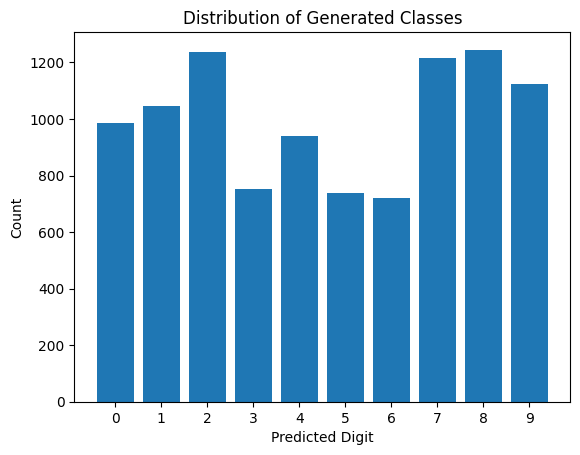

0.020070614350887882


In [ ]:
"""
Distribution for GAN with CNN for classification
"""

print(evaluate_distribution(G, model))

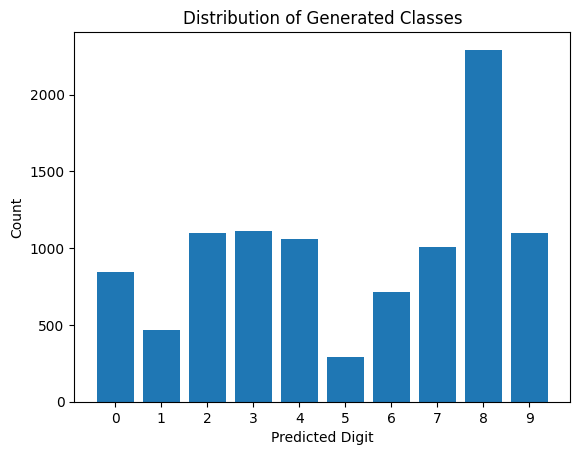

0.1207029334303357


In [ ]:
"""
Distribution for VAE with CNN for classification
"""

print(evaluate_distribution(vae_mnist.decoder, model, nz=20, is_vae=True))

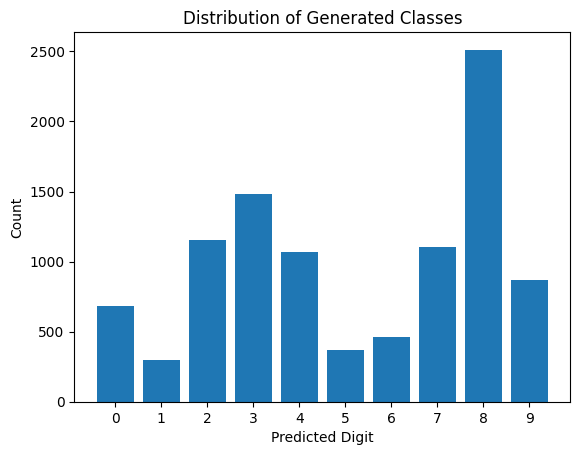

0.17714028359546816


In [ ]:
"""
Distribution for conv VAE with CNN for classification
"""

print(evaluate_distribution(conv_vae.decoder, model, nz=20, is_vae=True))

##With nearest neighboor for classification

In [ ]:
"""
Same function but with nearest neighbor classification
"""

def coverage_score_nn(generator, dataset, nz=100, n_samples=1000, is_vae=False):
    generator.eval()
    real_data = []
    real_labels = []

    for i in tqdm(range(len(dataset))):
        x, y = dataset[i]
        real_data.append(x.flatten())
        real_labels.append(y)
    real_data = torch.stack(real_data)
    real_labels = torch.tensor(real_labels)

    counts = torch.zeros(10, dtype=torch.long)
    batch_size = 128
    generated = 0
    for _ in tqdm(range(n_samples // batch_size)):
        bs = min(batch_size, n_samples - generated)
        if is_vae:
            noise = torch.randn(bs, nz, device=device)
        else:
            noise = torch.randn(bs, nz, 1, 1, device=device)
        fakes = generator(noise).detach().cpu().view(bs, -1)
        for i in range(bs):
            dist = (real_data - fakes[i]).pow(2).sum(dim=1)
            idx = torch.argmin(dist)
            counts[real_labels[idx].item()] += 1
        generated += bs
        if generated >= n_samples:
            break

    counts = counts.cpu().numpy()
    plt.bar(range(10), counts)
    plt.xticks(range(10), range(10))
    plt.title("Distribution of Generated Classes")
    plt.xlabel("Predicted Digit")
    plt.ylabel("Count")
    plt.show()

    p = counts / counts.sum()
    coverage_kl = 0.0
    for v in p:
        if v > 0:
            coverage_kl += v * math.log(v / 0.1)
    return coverage_kl


100%|██████████| 7/7 [00:31<00:00,  4.48s/it]


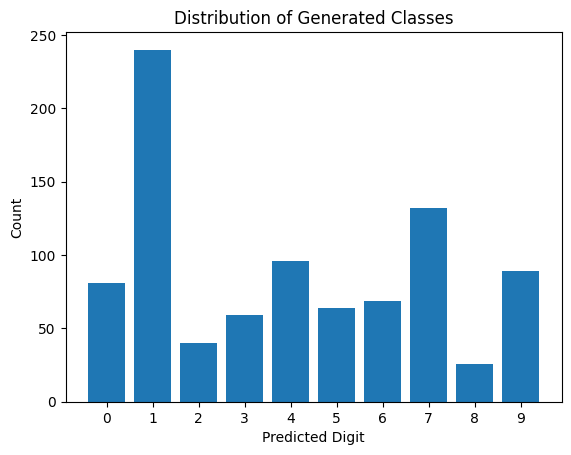


 0.17502626896420714


In [ ]:
"""
Distribution for WGAN with nn for classification
"""

print("\n", coverage_score_nn(G, test_dataset))

100%|██████████| 7/7 [00:29<00:00,  4.19s/it]


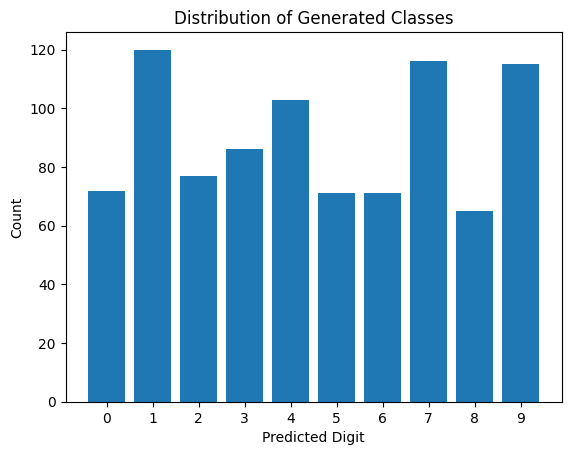


 0.02591958232311579


In [ ]:
"""
Distribution for VAE with nn for classification
"""

print("\n", coverage_score_nn(vae_mnist.decoder, test_dataset, nz=20, is_vae=True))

100%|██████████| 7/7 [00:31<00:00,  4.44s/it]


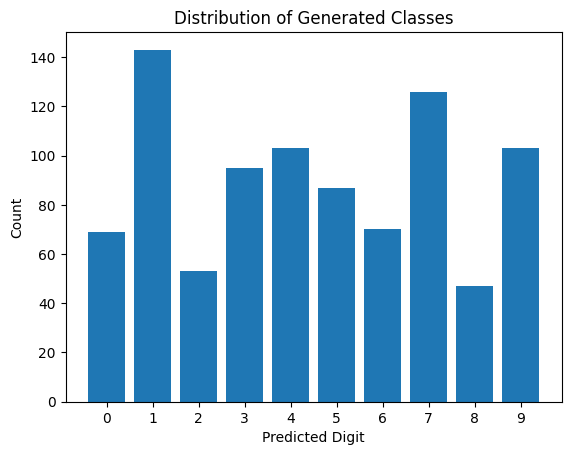


 0.053634869151547415


In [ ]:
"""
Distribution for con_VAE with nn for classification
"""

print("\n", coverage_score_nn(conv_vae.decoder, test_dataset, nz=20, is_vae=True))

What's interesting is that we get opposite results with the two different classification methods. With the CNN, the GAN performs significantly better—it produces a distribution that is close to uniform, whereas the VAE and ConvVAE do not (this is evident both in the KL divergence values and in the plotted distribution). However, when using the nearest neighbor classifier, we observe the opposite: the GAN performs worse compared to the VAEs.
I believe the WGAN is better in the end. The WGAN generate more accurate images but far from the training set, and it cannot fool such a simple neighbor classification that depends purely on pixel-wise similarity rather than learned abstractions.

***
##Question 4.c.
 The adapted FID gives a single scalar indicating how well generated samples approximate real data overall. So it's good to compare different models and know which one is better than the other. We know a model can be better, bu it's less easy to know if one is "good". Also, it doesn’t directly reveal whether certain digits are missing or overrepresented in the generated images.

 Our second criterion on the other end explicitly checks if each digit is produced at similar rates. It is easy to compute and interpret, but it does not capture finer aspects of visual fidelity. We don't know if our images are actually good. A model could produce “complete” coverage but still yield low‐quality images. Both metrics are complementary.